#

# Tech Chalenge Phase 1- Brazilian E-Commerce Public Dataset by Olist


## Libraries

In [364]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
import requests
import branca.colormap as cm
from folium.plugins import HeatMap
from branca.element import Element
import numpy.polynomial.polynomial as poly


## Read data
Read datasets and analyze contents

In [365]:
olist_customer = pd.read_csv('olist_customers_dataset.csv')
olist_geolocation = pd.read_csv('olist_geolocation_dataset.csv')
olist_orders = pd.read_csv('olist_orders_dataset.csv')
olist_order_items = pd.read_csv('olist_order_items_dataset.csv')
olist_order_payments = pd.read_csv('olist_order_payments_dataset.csv')
olist_order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
olist_products = pd.read_csv('olist_products_dataset.csv')
olist_sellers = pd.read_csv('olist_sellers_dataset.csv')

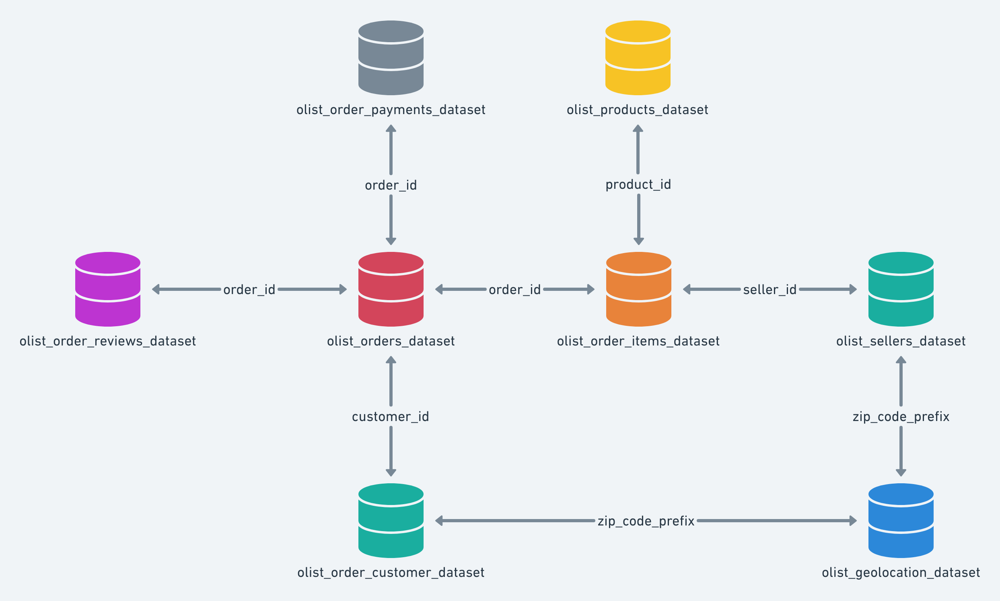

In [366]:
#Create a dataset with the overview of the datasets
datasets_overview= pd.DataFrame({
    'dataset_name': ['olist_customer', 'olist_geolocation', 'olist_orders', 'olist_order_items', 'olist_order_payments', 'olist_order_reviews', 'olist_products', 'olist_sellers'],
    'nr_rows': [len(olist_customer), len(olist_geolocation), len(olist_orders), len(olist_order_items), len(olist_order_payments), len(olist_order_reviews), len(olist_products), len(olist_sellers)],
    'nr_columns': [len(olist_customer.columns), len(olist_geolocation.columns), len(olist_orders.columns), len(olist_order_items.columns), len(olist_order_payments.columns), len(olist_order_reviews.columns), len(olist_products.columns), len(olist_sellers.columns)],
    'null_values': [olist_customer.isnull().sum().sum(), olist_geolocation.isnull().sum().sum(), olist_orders.isnull().sum().sum(), olist_order_items.isnull().sum().sum(), olist_order_payments.isnull().sum().sum(), olist_order_reviews.isnull().sum().sum(), olist_products.isnull().sum().sum(), olist_sellers.isnull().sum().sum()],
    'columns_with_nulls': [olist_customer.columns[olist_customer.isnull().any()].tolist(), olist_geolocation.columns[olist_geolocation.isnull().any()].tolist(), olist_orders.columns[olist_orders.isnull().any()].tolist(), olist_order_items.columns[olist_order_items.isnull().any()].tolist(), olist_order_payments.columns[olist_order_payments.isnull().any()].tolist(), olist_order_reviews.columns[olist_order_reviews.isnull().any()].tolist(), olist_products.columns[olist_products.isnull().any()].tolist(), olist_sellers.columns[olist_sellers.isnull().any()].tolist()]
})

datasets_overview

,dataset_name,nr_rows,nr_columns,null_values,columns_with_nulls
0,olist_customer,99441,5,0,[]
1,olist_geolocation,1000163,5,0,[]
2,olist_orders,99441,8,4908,"[order_approved_at, order_delivered_carrier_da..."
3,olist_order_items,112650,7,0,[]
4,olist_order_payments,103886,5,0,[]
5,olist_order_reviews,99224,7,145903,"[review_comment_title, review_comment_message]"
6,olist_products,32951,9,2448,"[product_category_name, product_name_lenght, p..."
7,olist_sellers,3095,4,0,[]


Read dataset containing cities data such as population and GDP

In [367]:
GDP_cities = pd.read_excel('PIB_municipios.xls')
GDP_cities['PIB'] = GDP_cities['PIB'].astype(int)
GDP_cities.head()

,Ano,Regiao,Estado,Código do Município,Município,PIB,PIB per capta,Populacao
0,2016,Norte,RO,1100015,Alta Floresta D'Oeste,478216984,18749.20,25506
1,2016,Norte,RO,1100023,Ariquemes,2184346102,20627.28,105896
2,2016,Norte,RO,1100031,Cabixi,133342247,21202.46,6289
3,2016,Norte,RO,1100049,Cacoal,1947282542,22159.18,87877
4,2016,Norte,RO,1100056,Cerejeiras,408193827,22729.21,17959


In [368]:
#Normalize cities names in GDP_cities dataset
GDP_cities['Município'] = GDP_cities['Município'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('ascii').str.lower().str.strip()
GDP_cities.head()

,Ano,Regiao,Estado,Código do Município,Município,PIB,PIB per capta,Populacao
0,2016,Norte,RO,1100015,alta floresta d'oeste,478216984,18749.20,25506
1,2016,Norte,RO,1100023,ariquemes,2184346102,20627.28,105896
2,2016,Norte,RO,1100031,cabixi,133342247,21202.46,6289
3,2016,Norte,RO,1100049,cacoal,1947282542,22159.18,87877
4,2016,Norte,RO,1100056,cerejeiras,408193827,22729.21,17959


In [369]:
#Change column names to match with orders dataset
GDP_cities.rename(columns={'Ano': 'year', 'Regiao': 'region', 'Município': 'customer_city', 'Estado': 'customer_state', 'PIB': 'GDP', 'PIB per capta': 'GDP_per_capita', 'Populacao': 'population'}, inplace=True)
GDP_cities.head()

,year,region,customer_state,Código do Município,customer_city,GDP,GDP_per_capita,population
0,2016,Norte,RO,1100015,alta floresta d'oeste,478216984,18749.20,25506
1,2016,Norte,RO,1100023,ariquemes,2184346102,20627.28,105896
2,2016,Norte,RO,1100031,cabixi,133342247,21202.46,6289
3,2016,Norte,RO,1100049,cacoal,1947282542,22159.18,87877
4,2016,Norte,RO,1100056,cerejeiras,408193827,22729.21,17959


# Basic Analysis

Basic Analysis of whats inside

In [370]:
olist_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [371]:
olist_customer.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [372]:
olist_order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


Creat a dataframe containing order_id, customer_id, customer_state, payment_value, price and freight value (aggregate price and freight value if there are more than one item in the order)

In [373]:
# Aggregate price and freight_value per order (sum if multiple items)
order_items_agg = olist_order_items.groupby(['order_id', 'seller_id']).agg(
    price=('price', 'sum'),
    freight_value=('freight_value', 'sum'),
    item_count=('order_item_id', 'count')
).reset_index()

# Average lat/lng per zip code (geolocation has duplicates)
geo_avg = olist_geolocation.groupby('geolocation_zip_code_prefix').agg(
    geolocation_lat=('geolocation_lat', 'mean'),
    geolocation_lng=('geolocation_lng', 'mean')
).reset_index()

# Merge orders with customers to get customer_state, extract time features
orders_customers = olist_orders[['order_id', 'customer_id', 'order_purchase_timestamp',
                                  'order_delivered_customer_date', 'order_estimated_delivery_date']].merge(
    olist_customer[['customer_id', 'customer_unique_id', 'customer_state', 'customer_city', 'customer_zip_code_prefix']],
    on='customer_id',
    how='left'
)

# Merge with geolocation
orders_customers = orders_customers.merge(
    geo_avg,
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix',
    how='left'
).drop(columns='geolocation_zip_code_prefix')

purchase_dt = pd.to_datetime(orders_customers['order_purchase_timestamp'])
delivered_dt = pd.to_datetime(orders_customers['order_delivered_customer_date'])
estimated_dt = pd.to_datetime(orders_customers['order_estimated_delivery_date'])

orders_customers['month'] = purchase_dt.dt.month
orders_customers['year'] = purchase_dt.dt.year
orders_customers['month_year'] = purchase_dt.dt.to_period('M').astype(str)
orders_customers['week_day'] = purchase_dt.dt.day_name()

# Define period of day based on hour
def get_period(hour):
    if 0 <= hour < 6:
        return 'Dawn'
    elif 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Night'
orders_customers['period_of_day'] = purchase_dt.dt.hour.apply(get_period)

# Delivery times in days
orders_customers['delivery_days']  = (delivered_dt - purchase_dt).dt.days
orders_customers['promised_days']  = (estimated_dt - purchase_dt).dt.days
orders_customers['delay_days']     = (delivered_dt - estimated_dt).dt.days.clip(lower=0)
orders_customers['is_late']        = orders_customers['delay_days'] > 0

orders_customers = orders_customers.drop(columns=['order_purchase_timestamp',
                                                   'order_delivered_customer_date',
                                                   'order_estimated_delivery_date'])

# Merge with payments
orders_customers_payments = orders_customers.merge(
    olist_order_payments[['order_id', 'payment_value', 'payment_type']],
    on='order_id',
    how='left'
)

# Add seller_state and seller_zip_code_prefix from sellers dataset
order_items_agg = order_items_agg.merge(
    olist_sellers[['seller_id', 'seller_state', 'seller_zip_code_prefix']],
    on='seller_id',
    how='left'
)

# Merge with aggregated order items
df_orders_base = orders_customers_payments.merge(
    order_items_agg,
    on='order_id',
    how='left'
)

# Review score (take max per order to avoid duplicates from multiple reviews)
review_score = (
    olist_order_reviews.groupby('order_id')['review_score'].max().reset_index()
)
df_orders_base = df_orders_base.merge(review_score, on='order_id', how='left')

df_orders_base.head()

,order_id,customer_id,customer_unique_id,customer_state,customer_city,customer_zip_code_prefix,geolocation_lat,geolocation_lng,month,year,...,is_late,payment_value,payment_type,seller_id,price,freight_value,item_count,seller_state,seller_zip_code_prefix,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,False,18.12,credit_card,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,1.0,SP,9350.0,4.0
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,False,2.00,voucher,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,1.0,SP,9350.0,4.0
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,False,18.59,voucher,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,1.0,SP,9350.0,4.0
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,BA,barreiras,47813,-12.177924,-44.660711,7,2018,...,False,141.46,boleto,289cdb325fb7e7f891c38608bf9e0962,118.70,22.76,1.0,SP,31570.0,4.0
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,GO,vianopolis,75265,-16.745150,-48.514783,8,2018,...,False,179.12,credit_card,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.22,1.0,SP,14840.0,5.0


Merge df_orders_base with GDP_cities creating df_orders

In [374]:
df_orders = df_orders_base.merge(
    GDP_cities[['customer_city', 'customer_state', 'GDP', 'GDP_per_capita', 'population', 'region']],
    left_on=['customer_city', 'customer_state'],
    right_on=['customer_city', 'customer_state'],
    how='left'
)

# Limit to orders up to July 2018
df_orders = df_orders[(df_orders['year'] < 2018) | ((df_orders['year'] == 2018) & (df_orders['month'] <= 7))]

df_orders.head()

,order_id,customer_id,customer_unique_id,customer_state,customer_city,customer_zip_code_prefix,geolocation_lat,geolocation_lng,month,year,...,price,freight_value,item_count,seller_state,seller_zip_code_prefix,review_score,GDP,GDP_per_capita,population,region
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,29.99,8.72,1.0,SP,9350.0,4.0,6.830667e+14,56741.72,12038174.0,Sudeste
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,29.99,8.72,1.0,SP,9350.0,4.0,6.989522e+14,57731.63,12106919.0,Sudeste
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,29.99,8.72,1.0,SP,9350.0,4.0,7.146834e+14,58691.90,12176865.0,Sudeste
3,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,29.99,8.72,1.0,SP,9350.0,4.0,6.830667e+14,56741.72,12038174.0,Sudeste
4,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,SP,sao paulo,3149,-23.576983,-46.587161,10,2017,...,29.99,8.72,1.0,SP,9350.0,4.0,6.989522e+14,57731.63,12106919.0,Sudeste


In [375]:
df_orders.columns.tolist()

['order_id',
 'customer_id',
 'customer_unique_id',
 'customer_state',
 'customer_city',
 'customer_zip_code_prefix',
 'geolocation_lat',
 'geolocation_lng',
 'month',
 'year',
 'month_year',
 'week_day',
 'period_of_day',
 'delivery_days',
 'promised_days',
 'delay_days',
 'is_late',
 'payment_value',
 'payment_type',
 'seller_id',
 'price',
 'freight_value',
 'item_count',
 'seller_state',
 'seller_zip_code_prefix',
 'review_score',
 'GDP',
 'GDP_per_capita',
 'population',
 'region']

In [376]:
# Region order and mapping -- used for ordered visualizations throughout the notebook
region_order = [
    'AM','RR','AP','PA','TO','RO','AC',
    'MA','PI','CE','RN','PB','PE','AL','SE','BA',
    'MG','ES','RJ','SP',
    'PR','SC','RS',
    'MS','MT','GO','DF'
]
regions_by_group = {
    'Norte':        ['AM','RR','AP','PA','TO','RO','AC'],
    'Nordeste':     ['MA','PI','CE','RN','PB','PE','AL','SE','BA'],
    'Sudeste':      ['MG','ES','RJ','SP'],
    'Sul':          ['PR','SC','RS'],
    'Centro-Oeste': ['MS','MT','GO','DF']
}


Datasets for analysis:
- **df_orders** -- full order data merged with GDP/cities, used for most analyses
- **df_orders_base** -- same as df_orders without GDP columns (all orders, no NaN from GDP merge)


In [377]:
delivered_ids = set(olist_orders[olist_orders['order_status'] == 'delivered']['order_id'])

kpi = pd.DataFrame({
    'Métrica': ['Pedidos processados', 'Clientes únicos', 'Vendedores ativos', 'GMV (pedidos entregues)', 'Ticket médio (AOV)'],
    'Valor': [
        f"{df_orders['order_id'].nunique():,.0f}",
        f"{df_orders['customer_unique_id'].nunique():,.0f}",
        f"{df_orders['seller_id'].nunique():,.0f}",
        f"R$ {df_orders[df_orders['order_id'].isin(delivered_ids)]['payment_value'].sum():,.2f}",
        f"R$ {df_orders.groupby('order_id')['payment_value'].sum().mean():,.2f}",
    ]
})

kpi.style     .set_caption('Visão Geral — Todo o Período')     .set_table_styles([
        {'selector': 'caption', 'props': [('font-size','14px'),('font-weight','bold')]},
        {'selector': 'th', 'props': [('background-color','#2c3e50'),('color','white')]},
        {'selector': 'tr:nth-child(even)', 'props': [('background-color','#f2f2f2')]},
    ])     .hide(axis='index')

Métrica,Valor
Pedidos processados,"92,909"
Clientes únicos,"89,819"
Vendedores ativos,"2,940"
GMV (pedidos entregues),"R$ 44,043,774.43"
Ticket médio (AOV),R$ 491.58


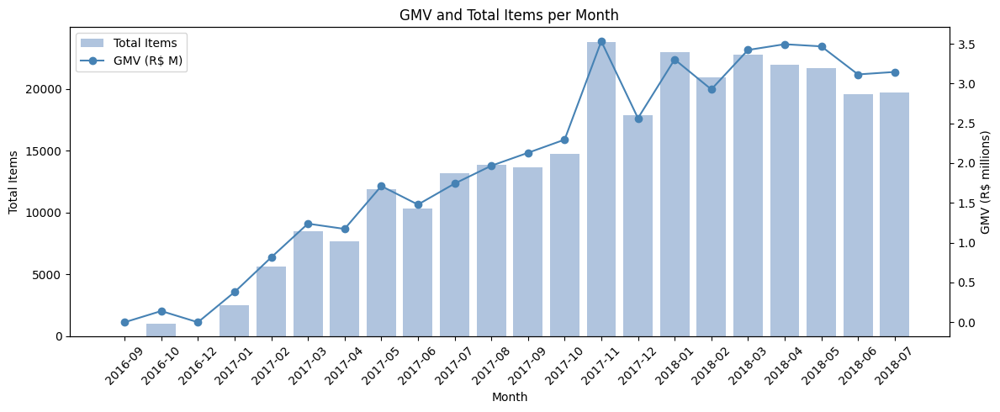

In [378]:
delivered_ids = set(olist_orders[olist_orders['order_status'] == 'delivered']['order_id'])

monthly_items = df_orders.groupby('month_year')['order_id'].count().reset_index(name='total_items')
monthly_gmv   = (df_orders[df_orders['order_id'].isin(delivered_ids)]
                 .groupby('month_year')['payment_value'].sum()
                 .reset_index(name='gmv'))
monthly = monthly_items.merge(monthly_gmv, on='month_year').sort_values('month_year')

fig, ax = plt.subplots(figsize=(12, 5))
ax.bar(monthly['month_year'], monthly['total_items'], color='lightsteelblue', label='Total Items')
ax.set_ylabel('Total Items')
ax.set_xlabel('Month')
ax.tick_params(axis='x', rotation=45)

axb = ax.twinx()
axb.plot(monthly['month_year'], monthly['gmv'] / 1_000_000, color='steelblue', marker='o', label='GMV (R$ M)')
axb.set_ylabel('GMV (R$ millions)')

l1, lb1 = ax.get_legend_handles_labels()
l2, lb2 = axb.get_legend_handles_labels()
ax.legend(l1 + l2, lb1 + lb2, loc='upper left')
ax.set_title('GMV and Total Items per Month')
plt.tight_layout()
plt.show()

# Analysis df_orders on time

Here a little deepdive on whats going on in montths/weeks

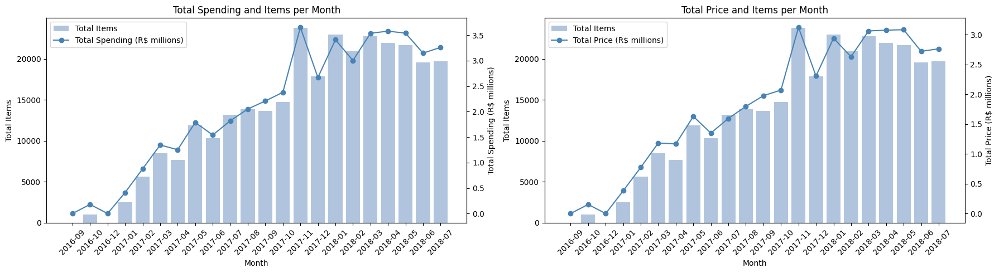

In [379]:
# Total payment value, price, and total items per month_year
monthly = df_orders.groupby('month_year').agg(
    payment_value=('payment_value', 'sum'),
    price=('price', 'sum'),
    total_items=('order_id', 'count')
).reset_index().sort_values('month_year')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 5))

for ax, col, ylabel, title in [
    (ax1, 'payment_value', 'Total Spending (R$ millions)', 'Total Spending and Items per Month'),
    (ax2, 'price',         'Total Price (R$ millions)',    'Total Price and Items per Month')
]:
    ax.bar(monthly['month_year'], monthly['total_items'], color='lightsteelblue', label='Total Items')
    ax.set_ylabel('Total Items')
    ax.set_xlabel('Month')
    ax.tick_params(axis='x', rotation=45)
    axb = ax.twinx()
    axb.plot(monthly['month_year'], monthly[col] / 1_000_000, color='steelblue', marker='o', label=ylabel)
    axb.set_ylabel(ylabel)
    l1, lb1 = ax.get_legend_handles_labels()
    l2, lb2 = axb.get_legend_handles_labels()
    ax.legend(l1 + l2, lb1 + lb2, loc='upper left')
    ax.set_title(title)

plt.tight_layout()
plt.show()


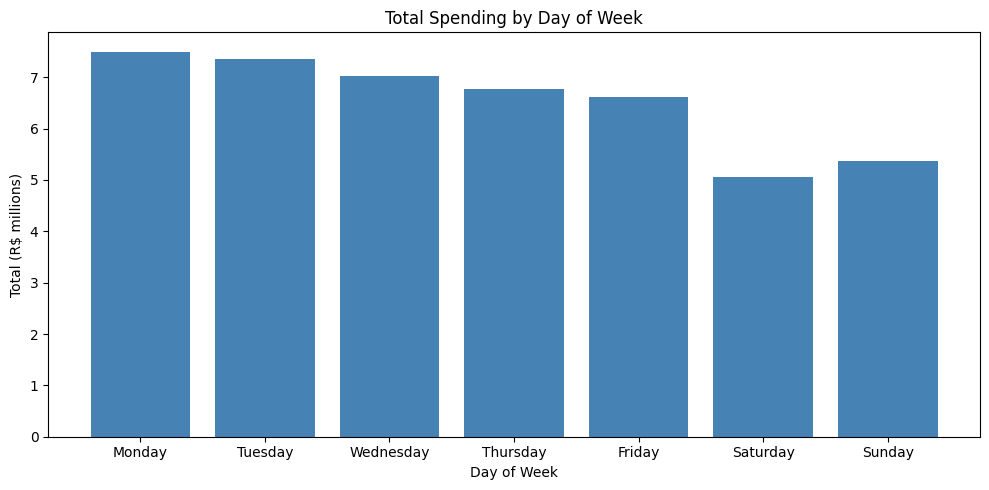

In [380]:
# Total payment value per week day
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_spending = df_orders.groupby('week_day')['payment_value'].sum().reindex(day_order)
plt.figure(figsize=(10, 5))
plt.bar(daily_spending.index, daily_spending.values / 1_000_000, color='steelblue')
plt.title('Total Spending by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Total (R$ millions)')
plt.tight_layout()
plt.show()


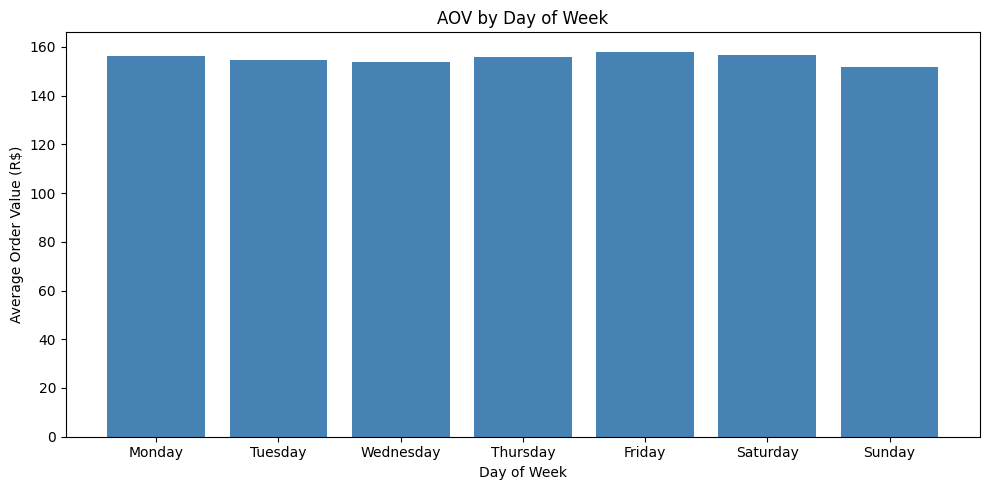

In [381]:
# AOV (Average Order Value) per week day
aov_week_day = df_orders.groupby('week_day')['payment_value'].mean().reindex(day_order)
plt.figure(figsize=(10, 5))
plt.bar(aov_week_day.index, aov_week_day.values, color='steelblue')
plt.title('AOV by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Average Order Value (R$)')
plt.tight_layout()
plt.show()


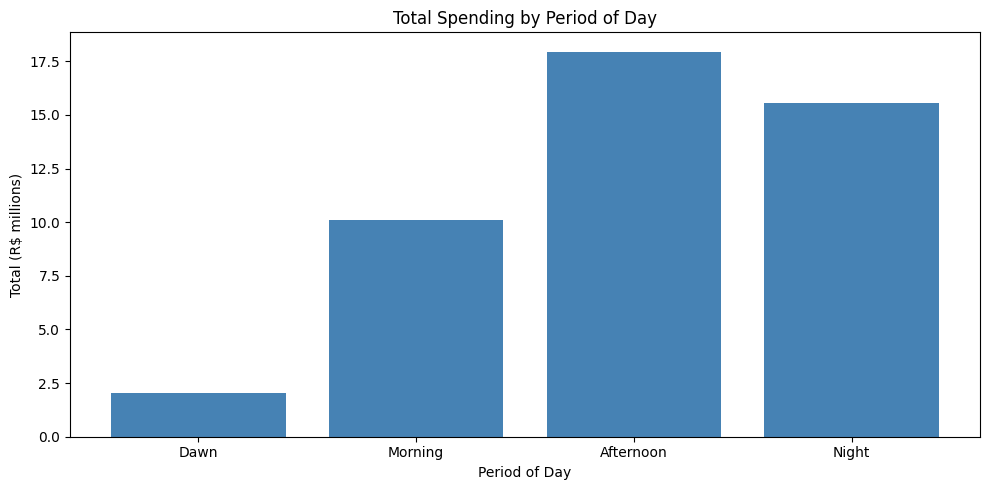

In [382]:
# Total payment value per period of day
period_order = ['Dawn', 'Morning', 'Afternoon', 'Night']
period_spending = df_orders.groupby('period_of_day')['payment_value'].sum().reindex(period_order)
plt.figure(figsize=(10, 5))
plt.bar(period_spending.index, period_spending.values / 1_000_000, color='steelblue')
plt.title('Total Spending by Period of Day')
plt.xlabel('Period of Day')
plt.ylabel('Total (R$ millions)')
plt.tight_layout()
plt.show()


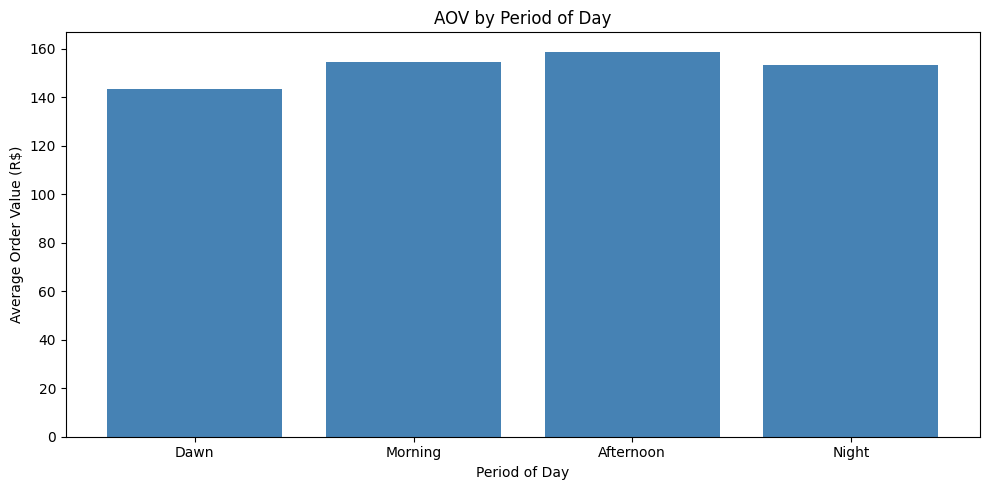

In [383]:
# AOV (Average Order Value) per period of day
aov_period = df_orders.groupby('period_of_day')['payment_value'].mean().reindex(period_order)
plt.figure(figsize=(10, 5))
plt.bar(aov_period.index, aov_period.values, color='steelblue')
plt.title('AOV by Period of Day')
plt.xlabel('Period of Day')
plt.ylabel('Average Order Value (R$)')
plt.tight_layout()
plt.show()


# Analysis df_orders for states/freight

Deep dive on freight value and price relationship, and how they evolve over time.

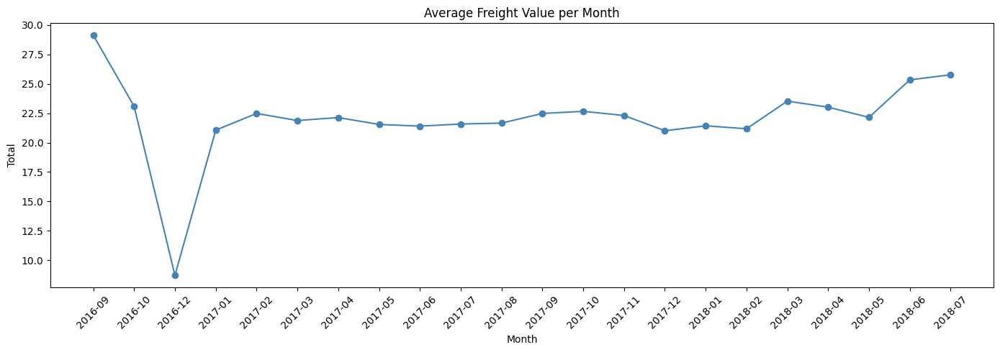

In [384]:
#Graphic with evolution of average fright value per month_year 
freight_monthly = df_orders.groupby('month_year')['freight_value'].mean().reset_index().sort_values('month_year')
plt.figure(figsize=(14, 5))
plt.plot(freight_monthly['month_year'], freight_monthly['freight_value'] , marker='o', color='steelblue')
plt.title('Average Freight Value per Month')
plt.xlabel('Month')
plt.ylabel('Total')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

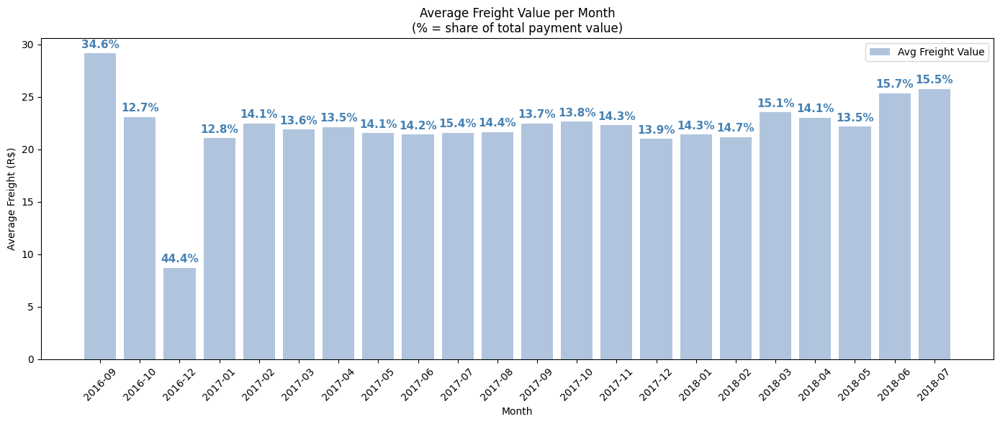

In [385]:
# Average freight value per month + % of total payment value
monthly_freight = df_orders.groupby('month_year').agg(
    avg_freight=('freight_value', 'mean'),
    total_freight=('freight_value', 'sum'),
    total_payment=('payment_value', 'sum')
).reset_index().sort_values('month_year')

monthly_freight['freight_pct'] = (monthly_freight['total_freight'] / monthly_freight['total_payment'] * 100).round(1)

fig, ax1 = plt.subplots(figsize=(14, 6))

bars = ax1.bar(monthly_freight['month_year'], monthly_freight['avg_freight'], color='lightsteelblue', label='Avg Freight Value')
ax1.set_ylabel('Average Freight (R$)')
ax1.set_xlabel('Month')
ax1.tick_params(axis='x', rotation=45)

for bar, pct in zip(bars, monthly_freight['freight_pct']):
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
             f'{pct}%',
             ha='center', va='bottom', fontsize=11, fontweight='bold', color='steelblue')

plt.title('Average Freight Value per Month\n(% = share of total payment value)')
plt.legend()
plt.tight_layout()
plt.show()

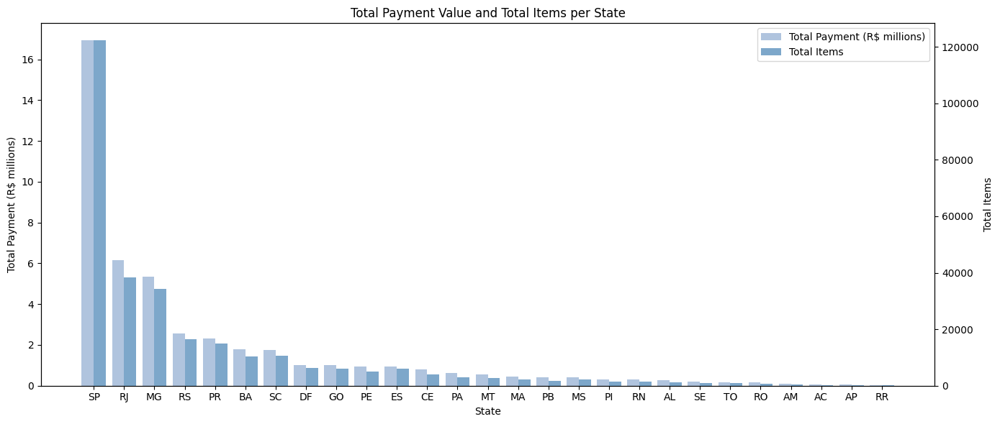

In [386]:
# Total payment value and total items per state
state_summary = df_orders.groupby('customer_state').agg(
    total_payment=('payment_value', 'sum'),
    total_items=('order_id', 'count')
).reset_index().sort_values('total_payment', ascending=False)

x = np.arange(len(state_summary))
width = 0.4

fig, ax1 = plt.subplots(figsize=(14, 6))

bars1 = ax1.bar(x - width/2, state_summary['total_payment'] / 1_000_000,
                width, color='lightsteelblue', label='Total Payment (R$ millions)')
ax1.set_ylabel('Total Payment (R$ millions)')
ax1.set_xlabel('State')
ax1.set_xticks(x)
ax1.set_xticklabels(state_summary['customer_state'])

ax2 = ax1.twinx()
bars2 = ax2.bar(x + width/2, state_summary['total_items'],
                width, color='steelblue', alpha=0.7, label='Total Items')
ax2.set_ylabel('Total Items')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.title('Total Payment Value and Total Items per State')
plt.tight_layout()
plt.show()

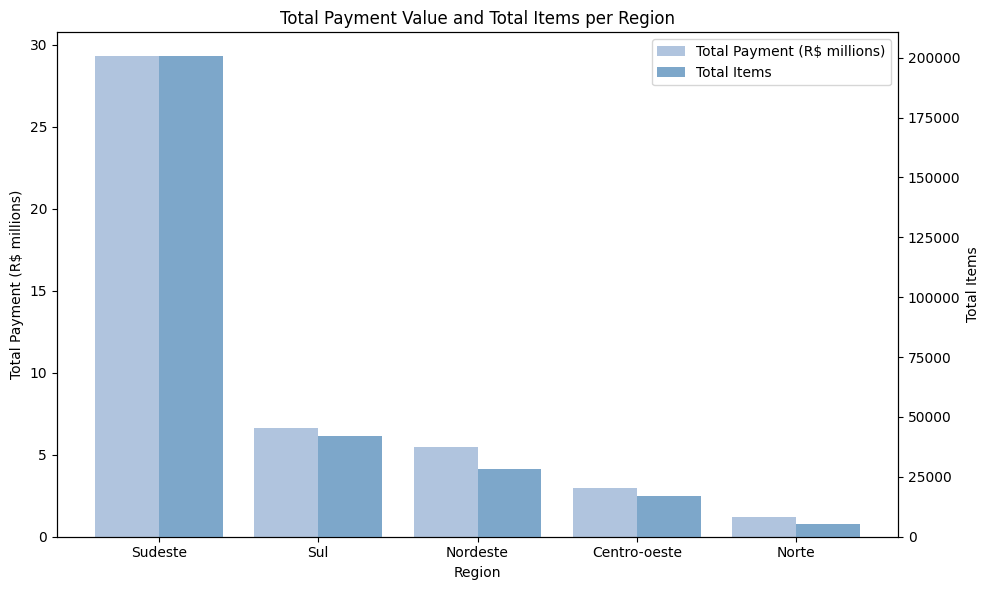

In [387]:
# Total payment value and total items per region
region_summary = df_orders.groupby('region').agg(
    total_payment=('payment_value', 'sum'),
    total_items=('order_id', 'count')
).reset_index().sort_values('total_payment', ascending=False)

x = np.arange(len(region_summary))
width = 0.4

fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar(x - width/2, region_summary['total_payment'] / 1_000_000,
        width, color='lightsteelblue', label='Total Payment (R$ millions)')
ax1.set_ylabel('Total Payment (R$ millions)')
ax1.set_xlabel('Region')
ax1.set_xticks(x)
ax1.set_xticklabels(region_summary['region'])

ax2 = ax1.twinx()
ax2.bar(x + width/2, region_summary['total_items'],
        width, color='steelblue', alpha=0.7, label='Total Items')
ax2.set_ylabel('Total Items')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.title('Total Payment Value and Total Items per Region')
plt.tight_layout()
plt.show()

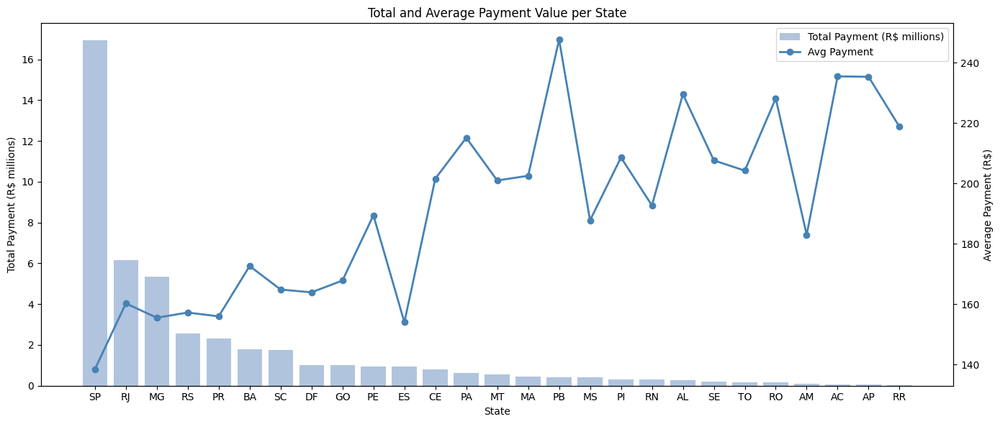

In [388]:
# Total/avg payment and freight per state (reused in cells below)
state_payment = df_orders.groupby('customer_state').agg(
    total_payment=('payment_value', 'sum'),
    avg_payment=('payment_value', 'mean'),
    avg_freight=('freight_value', 'mean'),
    total_freight=('freight_value', 'sum')
).reset_index()
state_payment['freight_pct'] = (state_payment['total_freight'] / state_payment['total_payment'] * 100).round(1)

sp_sorted = state_payment.sort_values('total_payment', ascending=False)
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.bar(sp_sorted['customer_state'], sp_sorted['total_payment'] / 1_000_000,
        color='lightsteelblue', label='Total Payment (R$ millions)')
ax1.set_ylabel('Total Payment (R$ millions)')
ax1.set_xlabel('State')
ax2 = ax1.twinx()
ax2.plot(sp_sorted['customer_state'], sp_sorted['avg_payment'],
         color='steelblue', marker='o', linewidth=2, label='Avg Payment')
ax2.set_ylabel('Average Payment (R$)')
l1, lb1 = ax1.get_legend_handles_labels()
l2, lb2 = ax2.get_legend_handles_labels()
ax1.legend(l1 + l2, lb1 + lb2, loc='upper right')
plt.title('Total and Average Payment Value per State')
plt.tight_layout()
plt.show()


In [389]:
delivered_ids = set(olist_orders[olist_orders['order_status'] == 'delivered']['order_id'])

# GMV por estado (apenas entregues)
gmv_state = (
    df_orders[df_orders['order_id'].isin(delivered_ids)]
    .groupby('customer_state')['payment_value'].sum()
    .reset_index(name='gmv')
)

# AOV e frete por pedido (agrupa por order_id antes de tirar média)
order_totals = df_orders.groupby(['customer_state', 'order_id']).agg(
    payment=('payment_value', 'sum'),
    freight=('freight_value', 'sum')
).reset_index()

aov_freight = order_totals.groupby('customer_state').agg(
    orders=('order_id', 'nunique'),
    aov=('payment', 'mean'),
    avg_freight=('freight', 'mean')
).reset_index()

# Vendedores por estado
sellers_state = (
    olist_sellers.groupby('seller_state')['seller_id'].nunique()
    .reset_index(name='sellers')
    .rename(columns={'seller_state': 'customer_state'})
)

# Montar tabela
state_kpi = aov_freight.merge(gmv_state, on='customer_state', how='left').merge(sellers_state, on='customer_state', how='left')
state_kpi['% GMV']       = (state_kpi['gmv']     / state_kpi['gmv'].sum()         * 100).round(1)
state_kpi['% Pedidos']   = (state_kpi['orders']   / state_kpi['orders'].sum()      * 100).round(1)
state_kpi['% Vendedores']= (state_kpi['sellers']  / state_kpi['sellers'].sum()     * 100).round(1)
state_kpi['Frete % AOV'] = (state_kpi['avg_freight'] / state_kpi['aov']            * 100).round(1)
state_kpi['AOV (R$)']    = state_kpi['aov'].round(2)

state_kpi = (
    state_kpi[['customer_state','% GMV','% Pedidos','% Vendedores','AOV (R$)','Frete % AOV']]
    .rename(columns={'customer_state': 'Estado'})
    .sort_values('% GMV', ascending=False)
    .reset_index(drop=True)
)

state_kpi.style     .set_caption('KPIs por Estado')     .set_table_styles([
        {'selector': 'caption', 'props': [('font-size','14px'),('font-weight','bold')]},
        {'selector': 'th', 'props': [('background-color','#2c3e50'),('color','white')]},
        {'selector': 'tr:nth-child(even)', 'props': [('background-color','#f2f2f2')]},
    ])     .format({'% GMV': '{:.1f}%', '% Pedidos': '{:.1f}%', '% Vendedores': '{:.1f}%',
             'AOV (R$)': 'R$ {:.2f}', 'Frete % AOV': '{:.1f}%'})     .hide(axis='index')

Estado,% GMV,% Pedidos,% Vendedores,AOV (R$),Frete % AOV
SP,37.0%,41.4%,59.7%,R$ 439.81,12.3%
RJ,13.4%,13.0%,5.5%,R$ 508.94,14.7%
MG,11.8%,11.8%,7.9%,R$ 489.62,14.6%
RS,5.7%,5.6%,4.2%,R$ 498.44,15.4%
PR,5.1%,5.1%,11.3%,R$ 491.50,14.7%
BA,3.9%,3.5%,0.6%,R$ 553.09,16.8%
SC,3.9%,3.7%,6.1%,R$ 515.87,14.6%
DF,2.3%,2.1%,1.0%,R$ 510.51,14.2%
GO,2.2%,2.0%,1.3%,R$ 532.70,15.4%
ES,2.1%,2.1%,0.7%,R$ 481.02,15.5%


In [423]:
state_to_region = {s: r for r, states in regions_by_group.items() for s in states}
sellers_region = (
    olist_sellers
    .assign(region=olist_sellers['seller_state'].map(state_to_region))
    .groupby('region')['seller_id'].nunique()
    .reset_index(name='total_sellers')
)

region_kpi = df_orders.groupby('region').agg(
    total_payment=('payment_value', 'sum'),
    total_orders=('order_id', 'nunique'),
    ticket_medio=('payment_value', 'mean'),
    frete_medio=('freight_value', 'mean')
).reset_index().merge(sellers_region, on='region', how='left')

region_kpi['pct_payment'] = (region_kpi['total_payment'] / region_kpi['total_payment'].sum() * 100).round(1)
region_kpi['pct_orders']  = (region_kpi['total_orders']  / region_kpi['total_orders'].sum()  * 100).round(1)
region_kpi['pct_sellers'] = (region_kpi['total_sellers'] / region_kpi['total_sellers'].sum() * 100).round(1)

region_kpi

,region,total_payment,total_orders,ticket_medio,frete_medio,total_sellers,pct_payment,pct_orders,pct_sellers
0,Centro-oeste,2984946.66,5415,174.466460,26.456005,NaN,6.6,5.9,NaN
1,Nordeste,5461197.72,8860,193.043398,35.336022,56.0,12.0,9.6,1.9
2,Norte,1177775.40,1740,214.296834,40.922137,5.0,2.6,1.9,0.2
3,Sudeste,29286763.68,62978,146.014756,19.599457,2287.0,64.3,68.3,75.8
4,Sul,6645681.48,13235,158.706631,23.831558,668.0,14.6,14.4,22.1


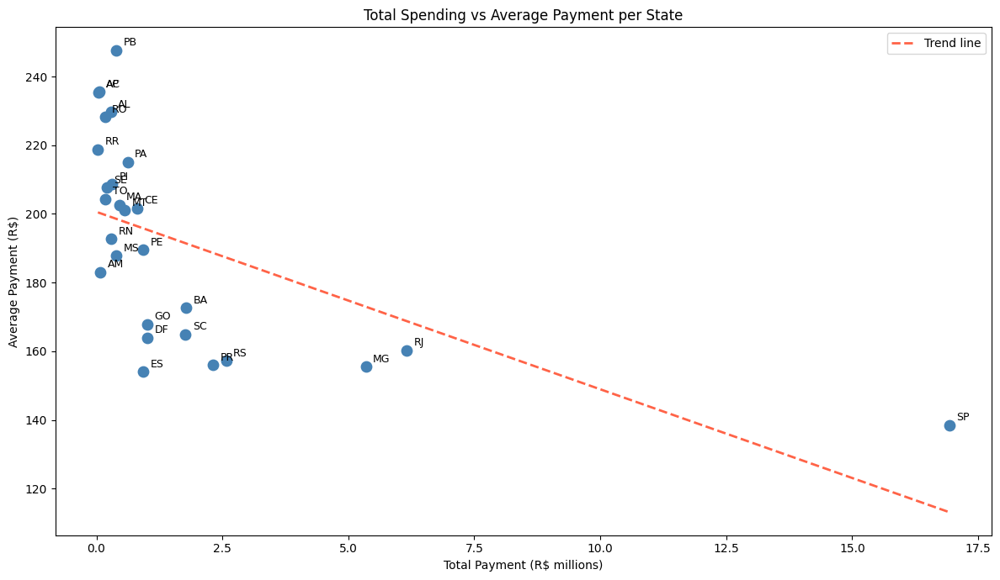

In [391]:
# Scatter: total spending vs average payment per state with trend line
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(state_payment['total_payment'] / 1_000_000, state_payment['avg_payment'],
           color='steelblue', s=80, zorder=3)
for _, row in state_payment.iterrows():
    ax.annotate(row['customer_state'],
                (row['total_payment'] / 1_000_000, row['avg_payment']),
                textcoords='offset points', xytext=(6, 4), fontsize=9)
z = np.polyfit(state_payment['total_payment'] / 1_000_000, state_payment['avg_payment'], 1)
p = np.poly1d(z)
x_line = np.linspace(state_payment['total_payment'].min() / 1_000_000,
                     state_payment['total_payment'].max() / 1_000_000, 100)
ax.plot(x_line, p(x_line), color='tomato', linewidth=2, linestyle='--', label='Trend line')
ax.set_xlabel('Total Payment (R$ millions)')
ax.set_ylabel('Average Payment (R$)')
ax.set_title('Total Spending vs Average Payment per State')
ax.legend()
plt.tight_layout()
plt.show()


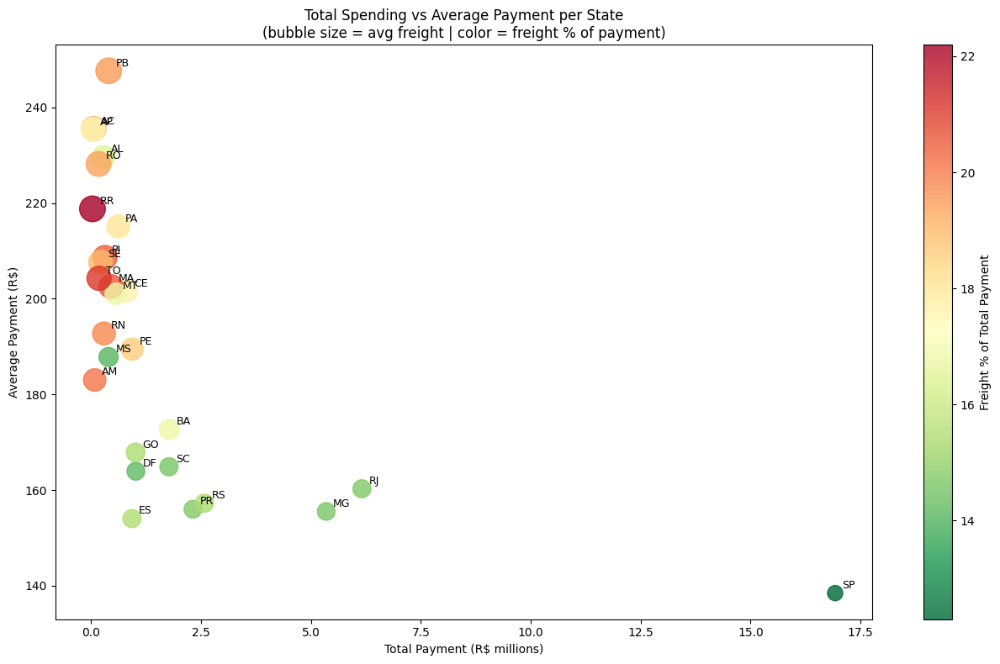

In [392]:
# Scatter: total spending vs average payment per state
# Bubble size = avg freight | Color = freight % of total payment
fig, ax = plt.subplots(figsize=(13, 8))
scatter = ax.scatter(
    state_payment['total_payment'] / 1_000_000, state_payment['avg_payment'],
    s=state_payment['avg_freight'] * 10, c=state_payment['freight_pct'],
    cmap='RdYlGn_r', alpha=0.8, zorder=3
)
for _, row in state_payment.iterrows():
    ax.annotate(row['customer_state'],
                (row['total_payment'] / 1_000_000, row['avg_payment']),
                textcoords='offset points', xytext=(6, 4), fontsize=9)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Freight % of Total Payment')
ax.set_xlabel('Total Payment (R$ millions)')
ax.set_ylabel('Average Payment (R$)')
ax.set_title('Total Spending vs Average Payment per State\n(bubble size = avg freight | color = freight % of payment)')
plt.tight_layout()
plt.show()


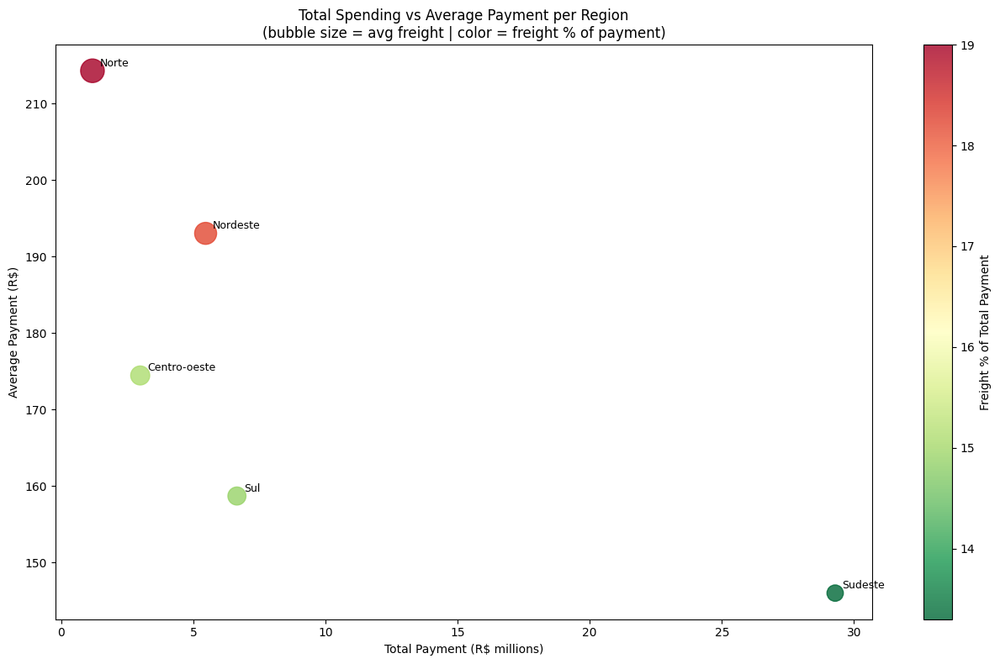

In [393]:
# Scatter: total spending vs average payment per region
# Bubble size = avg freight | Color = freight % of total payment
region_payment = df_orders.groupby('region').agg(
    total_payment=('payment_value', 'sum'),
    avg_payment=('payment_value', 'mean'),
    avg_freight=('freight_value', 'mean'),
    total_freight=('freight_value', 'sum')
).reset_index()
region_payment['freight_pct'] = (region_payment['total_freight'] / region_payment['total_payment'] * 100).round(1)

fig, ax = plt.subplots(figsize=(13, 8))
scatter = ax.scatter(
    region_payment['total_payment'] / 1_000_000, region_payment['avg_payment'],
    s=region_payment['avg_freight'] * 10, c=region_payment['freight_pct'],
    cmap='RdYlGn_r', alpha=0.8, zorder=3
)
for _, row in region_payment.iterrows():
    ax.annotate(row['region'],
                (row['total_payment'] / 1_000_000, row['avg_payment']),
                textcoords='offset points', xytext=(6, 4), fontsize=9)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Freight % of Total Payment')
ax.set_xlabel('Total Payment (R$ millions)')
ax.set_ylabel('Average Payment (R$)')
ax.set_title('Total Spending vs Average Payment per Region\n(bubble size = avg freight | color = freight % of payment)')
plt.tight_layout()
plt.show()


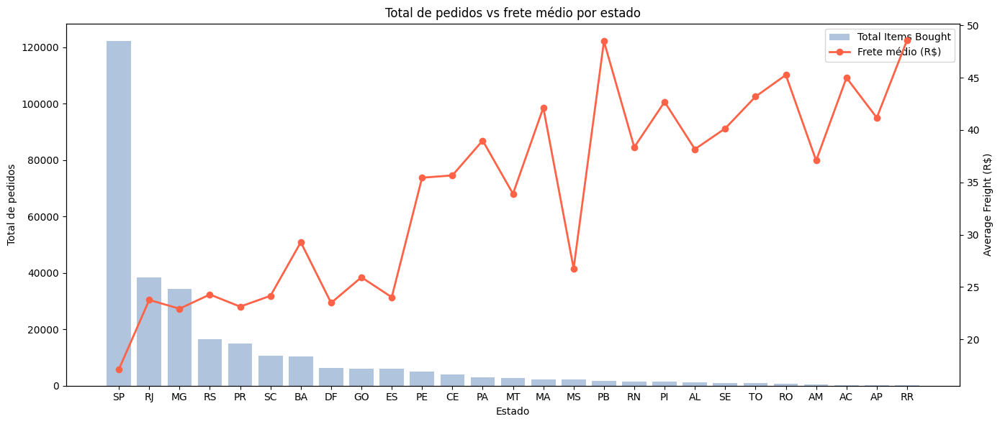

In [419]:
# Items bought vs avg freight per state
state_items_freight = df_orders.groupby('customer_state').agg(
    total_items=('order_id', 'count'),
    avg_freight=('freight_value', 'mean')
).reset_index().sort_values('total_items', ascending=False)

fig, ax1 = plt.subplots(figsize=(14, 6))

bars = ax1.bar(state_items_freight['customer_state'], state_items_freight['total_items'],
               color='lightsteelblue', label='Total Items Bought')
ax1.set_ylabel('Total de pedidos')
ax1.set_xlabel('Estado')

ax2 = ax1.twinx()
ax2.plot(state_items_freight['customer_state'], state_items_freight['avg_freight'],
         color='tomato', marker='o', linewidth=2, label='Frete médio (R$)')
ax2.set_ylabel('Average Freight (R$)')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.title('Total de pedidos vs frete médio por estado')
plt.tight_layout()
plt.show()

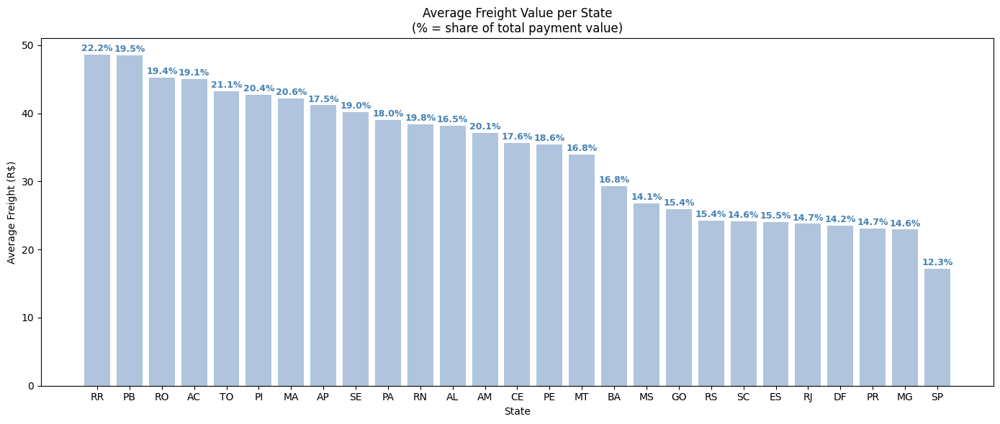

In [395]:
# Average freight value per state
state_freight = df_orders.groupby('customer_state').agg(
    avg_freight=('freight_value', 'mean'),
    total_freight=('freight_value', 'sum'),
    total_payment=('payment_value', 'sum')
).reset_index()

state_freight['freight_pct'] = (state_freight['total_freight'] / state_freight['total_payment'] * 100).round(1)
state_freight = state_freight.sort_values('avg_freight', ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))

bars = ax.bar(state_freight['customer_state'], state_freight['avg_freight'], color='lightsteelblue')

for bar, pct in zip(bars, state_freight['freight_pct']):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.2,
            f'{pct}%', ha='center', va='bottom', fontsize=9, fontweight='bold', color='steelblue')

ax.set_title('Average Freight Value per State\n(% = share of total payment value)')
ax.set_xlabel('State')
ax.set_ylabel('Average Freight (R$)')
plt.tight_layout()
plt.show()

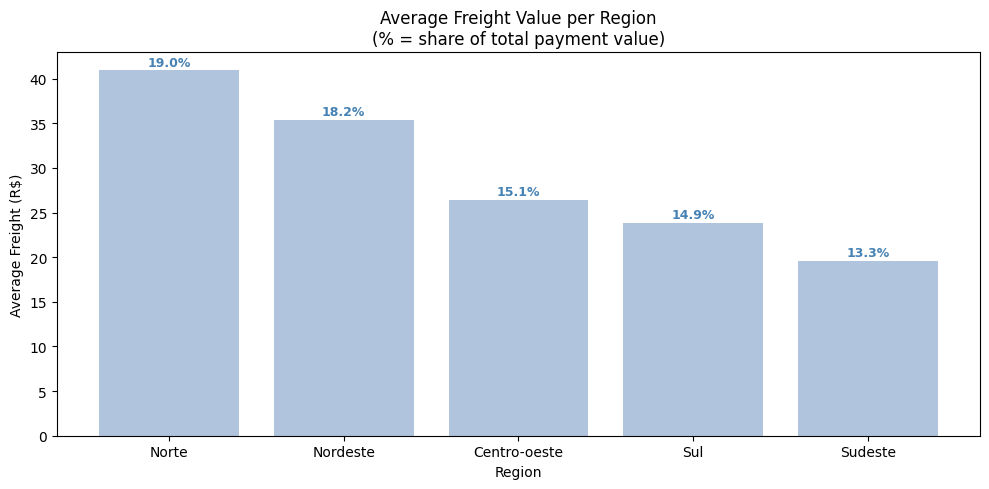

In [396]:
#Same as abor, but per region instead of state
region_freight = df_orders.groupby('region').agg(
    avg_freight=('freight_value', 'mean'),
    total_freight=('freight_value', 'sum'),
    total_payment=('payment_value', 'sum')
).reset_index()

region_freight['freight_pct'] = (region_freight['total_freight'] / region_freight['total_payment'] * 100).round(1)
region_freight = region_freight.sort_values('avg_freight', ascending=False)
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(region_freight['region'], region_freight['avg_freight'], color='lightsteelblue')
for bar, pct in zip(bars, region_freight['freight_pct']):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.2,
            f'{pct}%', ha='center', va='bottom', fontsize=9, fontweight='bold', color='steelblue')
ax.set_title('Average Freight Value per Region\n(% = share of total payment value)')
ax.set_xlabel('Region')
ax.set_ylabel('Average Freight (R$)')
plt.tight_layout()
plt.show()

C:\Users\romul\AppData\Local\Temp\ipykernel_29292\62784703.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(top30['label'], rotation=45, ha='right', fontsize=8)


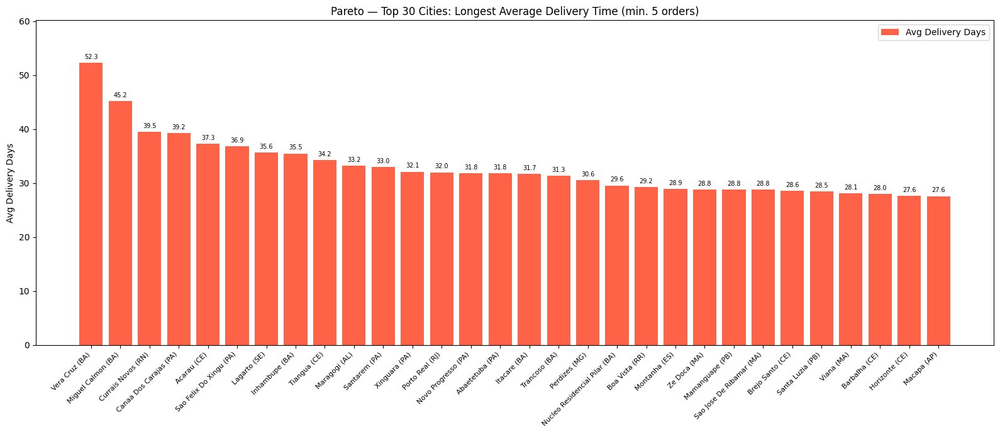

In [397]:
# Pareto chart -- top 30 cities with longest average delivery time
delivery_city_check = (
    df_orders.dropna(subset=['delivery_days'])
    .groupby(['customer_city', 'customer_state'])
    .agg(
        avg_delivery=('delivery_days', 'mean'),
        n_orders=('order_id', 'nunique')
    )
    .reset_index()
)
delivery_city_check = delivery_city_check[delivery_city_check['n_orders'] >= 5].sort_values('avg_delivery', ascending=False)

top30 = delivery_city_check.head(30).copy()
top30['label'] = top30['customer_city'].str.title() + ' (' + top30['customer_state'] + ')'

fig, ax1 = plt.subplots(figsize=(16, 7))

bars = ax1.bar(top30['label'], top30['avg_delivery'], color='tomato', label='Avg Delivery Days')
ax1.set_ylabel('Avg Delivery Days')
ax1.set_ylim(0, top30['avg_delivery'].max() * 1.15)
ax1.bar_label(bars, fmt='%.1f', padding=3, fontsize=7)
ax1.set_xticklabels(top30['label'], rotation=45, ha='right', fontsize=8)



lines1, labels1 = ax1.get_legend_handles_labels()
ax1.legend(lines1, labels1, loc='upper right')

plt.title('Pareto — Top 30 Cities: Longest Average Delivery Time (min. 5 orders)')
plt.tight_layout()
plt.show()


# Analysis df_orders for GPD/price

Take a look on how GDP affects orders

In [398]:
# Shared color map for region-colored scatter charts
REGION_COLORS = {
    r: plt.cm.tab10.colors[i]
    for i, r in enumerate(sorted(df_orders['region'].dropna().unique()))
}


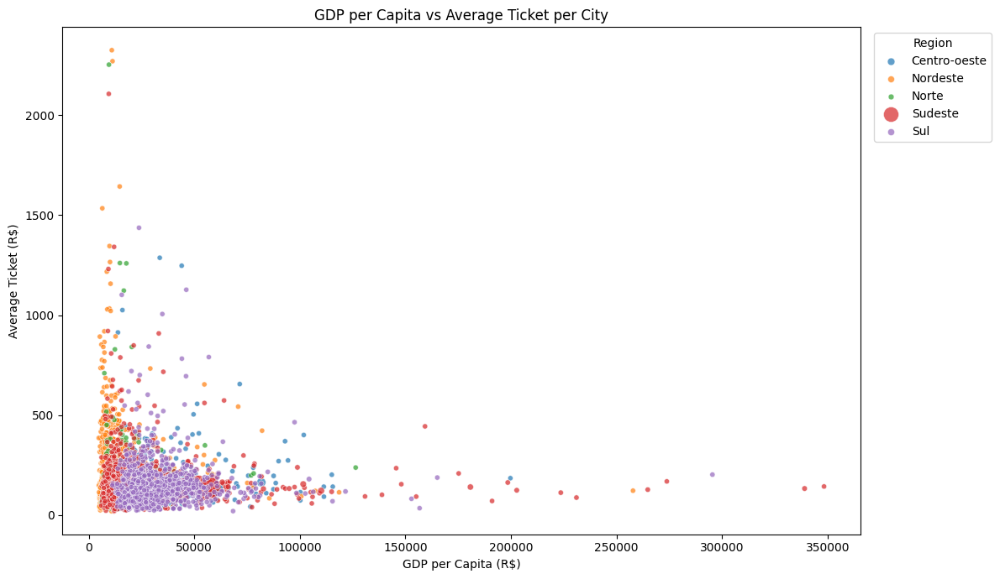

In [399]:
# GDP per capita vs average ticket per city
city_summary = df_orders.groupby(["customer_city", "region"]).agg(
    avg_ticket=("payment_value", "mean"),
    total_items=("order_id", "count"),
    GDP_per_capita=("GDP_per_capita", "mean")
).reset_index().dropna(subset=["GDP_per_capita"])

fig, ax = plt.subplots(figsize=(12, 7))
for region, color in REGION_COLORS.items():
    subset = city_summary[city_summary["region"] == region]
    sizes = (subset["total_items"] / city_summary["total_items"].max()) * 300 + 20
    ax.scatter(subset["GDP_per_capita"], subset["avg_ticket"],
               s=sizes, color=color, label=region, alpha=0.7, edgecolors="white", linewidth=0.5)
ax.set_xlabel("GDP per Capita (R$)")
ax.set_ylabel("Average Ticket (R$)")
ax.set_title("GDP per Capita vs Average Ticket per City")
ax.legend(title="Region", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()
plt.show()


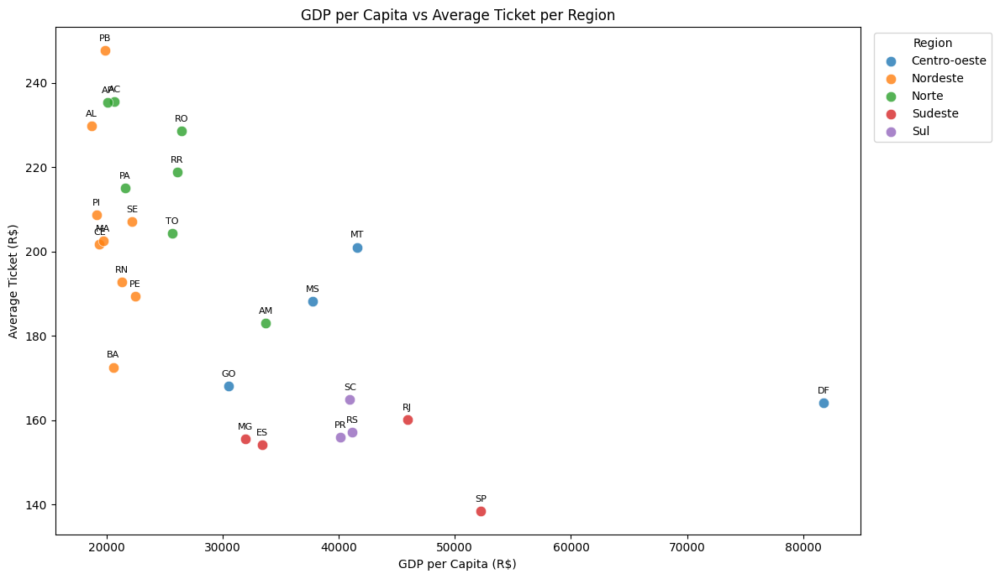

In [400]:
# GDP per capita vs average ticket per region
region_summary = df_orders.groupby(["customer_state", "region"]).agg(
    avg_ticket=("payment_value", "mean"),
    total_items=("order_id", "count"),
    GDP_per_capita=("GDP_per_capita", "mean")
).reset_index().dropna(subset=["GDP_per_capita"])

fig, ax = plt.subplots(figsize=(12, 7))
for region, color in REGION_COLORS.items():
    subset = region_summary[region_summary["region"] == region]
    ax.scatter(subset["GDP_per_capita"], subset["avg_ticket"],
               color=color, label=region, alpha=0.8, s=80, edgecolors="white", linewidth=0.5)
    for _, row in subset.iterrows():
        ax.annotate(row["customer_state"], (row["GDP_per_capita"], row["avg_ticket"]),
                    textcoords="offset points", xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("GDP per Capita (R$)")
ax.set_ylabel("Average Ticket (R$)")
ax.set_title("GDP per Capita vs Average Ticket per Region")
ax.legend(title="Region", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()
plt.savefig("gdp_ticket_region.png", dpi=150, bbox_inches="tight")
plt.show()


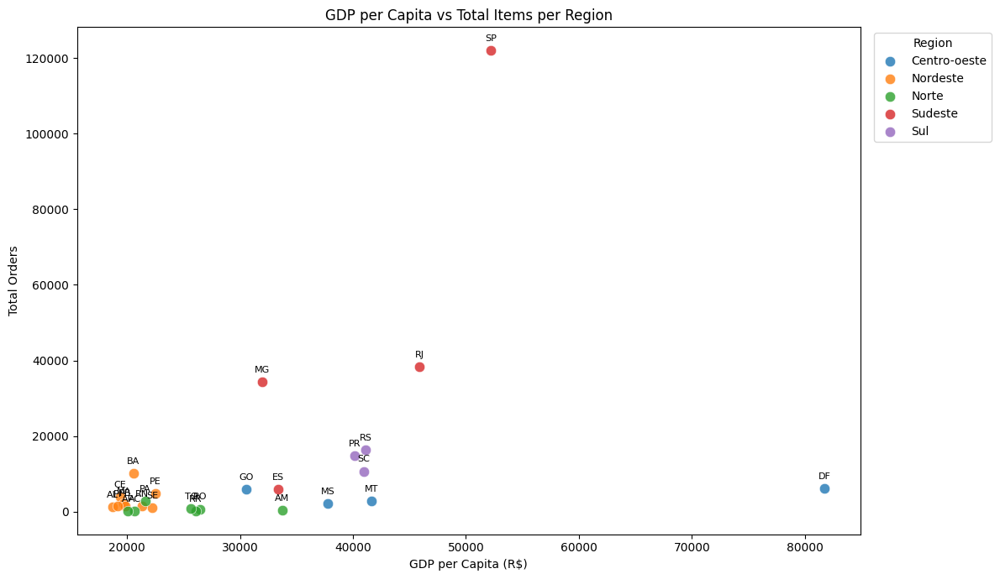

In [401]:
# GDP per capita vs total items per region
region_summary = df_orders.groupby(["customer_state", "region"]).agg(
    total_items=("order_id", "count"),
    GDP_per_capita=("GDP_per_capita", "mean")
).reset_index().dropna(subset=["GDP_per_capita"])

fig, ax = plt.subplots(figsize=(12, 7))
for region, color in REGION_COLORS.items():
    subset = region_summary[region_summary["region"] == region]
    ax.scatter(subset["GDP_per_capita"], subset["total_items"],
               color=color, label=region, alpha=0.8, s=80, edgecolors="white", linewidth=0.5)
    for _, row in subset.iterrows():
        ax.annotate(row["customer_state"], (row["GDP_per_capita"], row["total_items"]),
                    textcoords="offset points", xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("GDP per Capita (R$)")
ax.set_ylabel("Total Orders")
ax.set_title("GDP per Capita vs Total Items per Region")
ax.legend(title="Region", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()
plt.savefig("gdp_items_region.png", dpi=150, bbox_inches="tight")
plt.show()


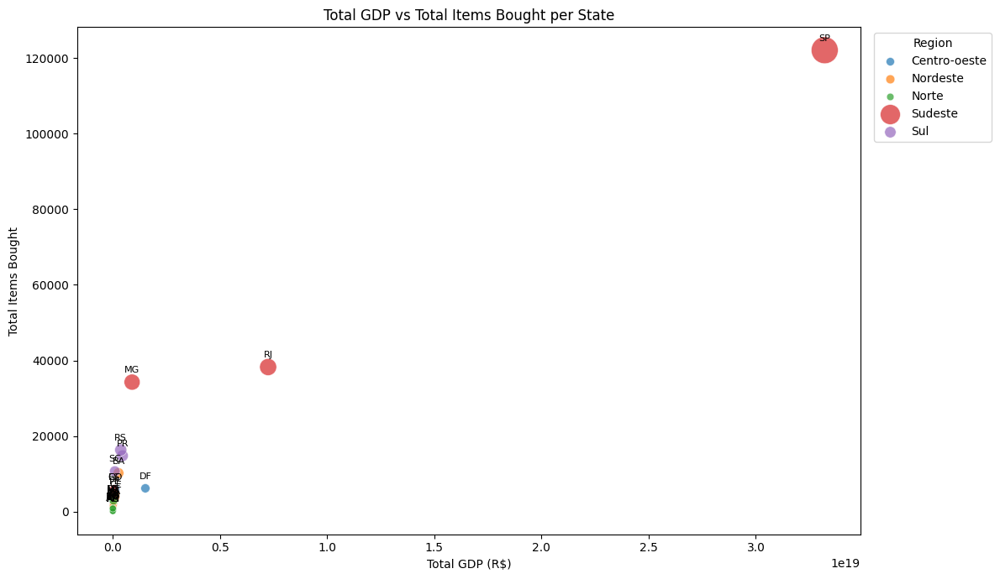

In [402]:
# GDP total per state vs total items bought, colored by region
state_gdp = df_orders.groupby(["customer_state", "region"]).agg(
    total_items=("order_id", "count"),
    total_payment=("payment_value", "sum"),
    GDP=("GDP", "sum")
).reset_index().dropna(subset=["GDP"])

sizes = (state_gdp["total_payment"] / state_gdp["total_payment"].max()) * 500 + 30

fig, ax = plt.subplots(figsize=(12, 7))
for region, color in REGION_COLORS.items():
    mask = state_gdp["region"] == region
    subset = state_gdp[mask]
    ax.scatter(subset["GDP"], subset["total_items"],
               s=sizes[mask], color=color, label=region, alpha=0.7, edgecolors="white", linewidth=0.5)
    for _, row in subset.iterrows():
        ax.annotate(row["customer_state"], (row["GDP"], row["total_items"]),
                    textcoords="offset points", xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("Total GDP (R$)")
ax.set_ylabel("Total Items Bought")
ax.set_title("Total GDP vs Total Items Bought per State")
ax.legend(title="Region", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()
plt.savefig("gdp_items_state.png", dpi=150, bbox_inches="tight")
plt.show()


# Deep dive on freight

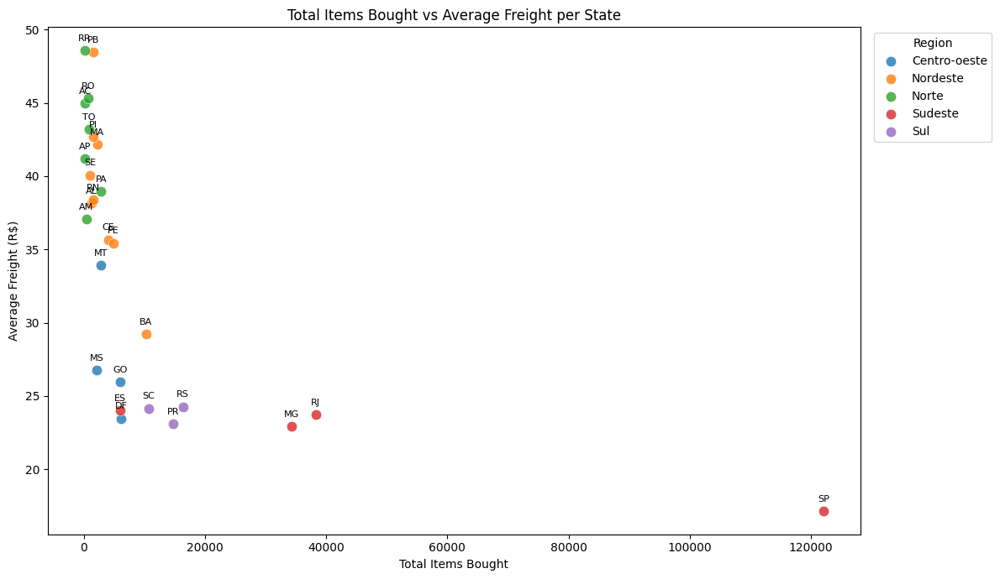

In [403]:
# Total items vs avg freight per state, colored by region
state_freight_items = df_orders.groupby(["customer_state", "region"]).agg(
    total_items=("order_id", "count"),
    avg_freight=("freight_value", "mean"),
    total_payment=("payment_value", "sum")
).reset_index().dropna(subset=["region"])

fig, ax = plt.subplots(figsize=(12, 7))
for region, color in REGION_COLORS.items():
    subset = state_freight_items[state_freight_items["region"] == region]
    ax.scatter(subset["total_items"], subset["avg_freight"],
               color=color, label=region, alpha=0.8, s=80, edgecolors="white", linewidth=0.5)
    for _, row in subset.iterrows():
        ax.annotate(row["customer_state"], (row["total_items"], row["avg_freight"]),
                    textcoords="offset points", xytext=(0, 8), ha="center", fontsize=8)
ax.set_xlabel("Total Items Bought")
ax.set_ylabel("Average Freight (R$)")
ax.set_title("Total Items Bought vs Average Freight per State")
ax.legend(title="Region", bbox_to_anchor=(1.01, 1), loc="upper left")
plt.tight_layout()
plt.savefig("items_freight_state.png", dpi=150, bbox_inches="tight")
plt.show()


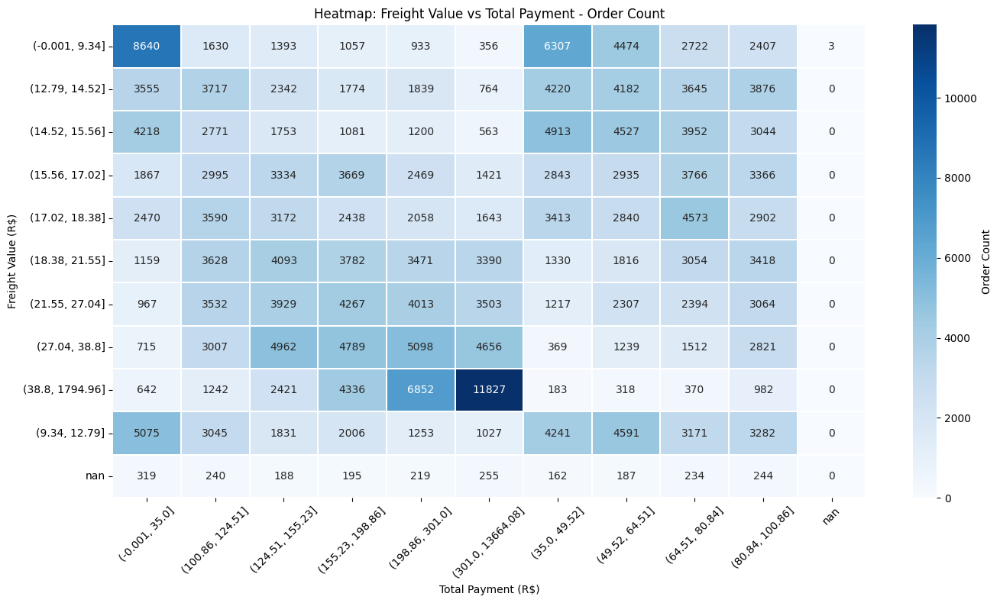

In [404]:
# Heatmap: freight value bins vs total payment bins, color = order count
df_heat = df_orders.copy()
df_heat['freight_bin'] = pd.qcut(df_heat['freight_value'], q=10, duplicates='drop').astype(str)
df_heat['payment_bin'] = pd.qcut(df_heat['payment_value'], q=10, duplicates='drop').astype(str)
heat_data = df_heat.groupby(['freight_bin', 'payment_bin']).size().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(14, 8))
sns.heatmap(heat_data, cmap='Blues', annot=True, fmt='d', linewidths=0.3, ax=ax,
            cbar_kws={'label': 'Order Count'})
ax.set_xlabel('Total Payment (R$)')
ax.set_ylabel('Freight Value (R$)')
ax.set_title('Heatmap: Freight Value vs Total Payment - Order Count')
ax.tick_params(axis='x', rotation=45)
ax.tick_params(axis='y', rotation=0)
plt.tight_layout()
plt.savefig('heatmap_freight_payment.png', dpi=150, bbox_inches='tight')
plt.show()


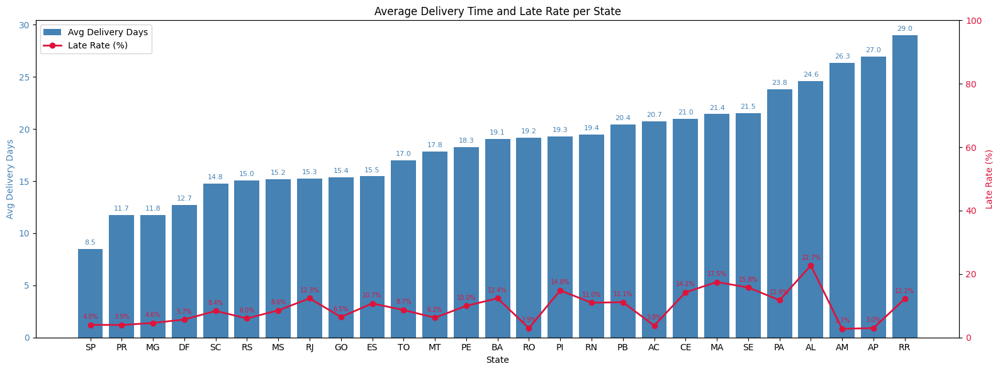

In [405]:
# Average delivery time and late rate per state
delivery_state = df_orders.dropna(subset=['delivery_days', 'is_late']).groupby('customer_state').agg(
    avg_delivery_days=('delivery_days', 'mean'),
    late_rate=('is_late', 'mean')
).reset_index().sort_values('avg_delivery_days')

delivery_state['late_pct'] = delivery_state['late_rate'] * 100

fig, ax1 = plt.subplots(figsize=(16, 6))

bars = ax1.bar(delivery_state['customer_state'], delivery_state['avg_delivery_days'],
               color='steelblue', label='Avg Delivery Days')
ax1.set_xlabel('State')
ax1.set_ylabel('Avg Delivery Days', color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

for bar, val in zip(bars, delivery_state['avg_delivery_days']):
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
             f'{val:.1f}', ha='center', va='bottom', fontsize=8, color='steelblue')

ax2 = ax1.twinx()
ax2.plot(delivery_state['customer_state'], delivery_state['late_pct'],
         color='crimson', marker='o', linewidth=2, markersize=6, label='Late Rate (%)')
ax2.set_ylabel('Late Rate (%)', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')
ax2.set_ylim(0, 100)

for x, y in zip(delivery_state['customer_state'], delivery_state['late_pct']):
    ax2.text(x, y + 1.5, f'{y:.1f}%', ha='center', va='bottom', fontsize=7, color='crimson')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title('Average Delivery Time and Late Rate per State')
plt.tight_layout()
plt.show()


In [ ]:
#Evaluation of delivery time per region
eval_delivery = (
    df_orders.dropna(subset=['delivery_days', 'promised_days', 'is_late'])
    .drop_duplicates(subset='order_id')
    .groupby('region').agg(
        prazo_real_medio=('delivery_days', 'mean'),
        prazo_prometido_medio=('promised_days', 'mean'),
        pct_atrasos=('is_late', 'mean'),
        total_pedidos=('order_id', 'count')
    ).reset_index()
)

eval_delivery['pct_atrasos'] = (eval_delivery['pct_atrasos'] * 100).round(1)
eval_delivery['prazo_real_medio'] = eval_delivery['prazo_real_medio'].round(1)
eval_delivery['prazo_prometido_medio'] = eval_delivery['prazo_prometido_medio'].round(1)
eval_delivery = eval_delivery.sort_values('pct_atrasos', ascending=False).reset_index(drop=True)

eval_delivery.rename(columns={
    'region':               'Região',
    'prazo_real_medio':     'Prazo Real Médio (dias)',
    'prazo_prometido_medio':'Prazo Prometido Médio (dias)',
    'pct_atrasos':          '% Atrasos',
    'total_pedidos':        'Total Pedidos'
}).style     .set_caption('Avaliação de Prazo de Entrega por Região')     .set_table_styles([
        {'selector': 'caption', 'props': [('font-size','14px'),('font-weight','bold')]},
        {'selector': 'th', 'props': [('background-color','#2c3e50'),('color','white')]},
        {'selector': 'tr:nth-child(even)', 'props': [('background-color','#f2f2f2')]},
    ])     .format({'% Atrasos': '{:.1f}%', 'Total Pedidos': '{:,.0f}'})     .hide(axis='index')

In [ ]:
# Average delivery time and late rate per region
delivery_region = (
    df_orders.dropna(subset=['delivery_days', 'promised_days', 'is_late'])
    .drop_duplicates(subset='order_id')
    .groupby('region').agg(
        avg_delivery_days=('delivery_days', 'mean'),
        avg_promised_days=('promised_days', 'mean'),
        late_rate=('is_late', 'mean')
    ).reset_index().sort_values('avg_delivery_days')
)

delivery_region['late_pct'] = delivery_region['late_rate'] * 100

x = np.arange(len(delivery_region['region']))
width = 0.35

fig, ax1 = plt.subplots(figsize=(11, 6))

bars1 = ax1.bar(x - width/2, delivery_region['avg_delivery_days'], width,
                color='steelblue', label='Avg Delivery Days')
bars2 = ax1.bar(x + width/2, delivery_region['avg_promised_days'], width,
                color='lightsteelblue', label='Avg Promised Days')

ax1.set_xticks(x)
ax1.set_xticklabels(delivery_region['region'])
ax1.set_xlabel('Region')
ax1.set_ylabel('Days')

for bar in bars1:
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
             f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9, color='steelblue')
for bar in bars2:
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3,
             f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9, color='slategrey')

ax2 = ax1.twinx()
ax2.plot(x, delivery_region['late_pct'],
         color='crimson', marker='o', linewidth=2, markersize=8, label='Late Rate (%)')
ax2.set_ylabel('Late Rate (%)', color='crimson')
ax2.tick_params(axis='y', labelcolor='crimson')
ymin = delivery_region['late_pct'].min() * 0.85
ymax = delivery_region['late_pct'].max() * 1.10
ax2.set_ylim(ymin, ymax)

for xi, y in zip(x, delivery_region['late_pct']):
    ax2.text(xi, y + 1.5, f'{y:.1f}%', ha='center', va='bottom', fontsize=9, color='crimson')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title('Average Delivery Time and Late Rate per Region')
plt.tight_layout()
plt.show()

# Playing with maps
a lot here was done with AI

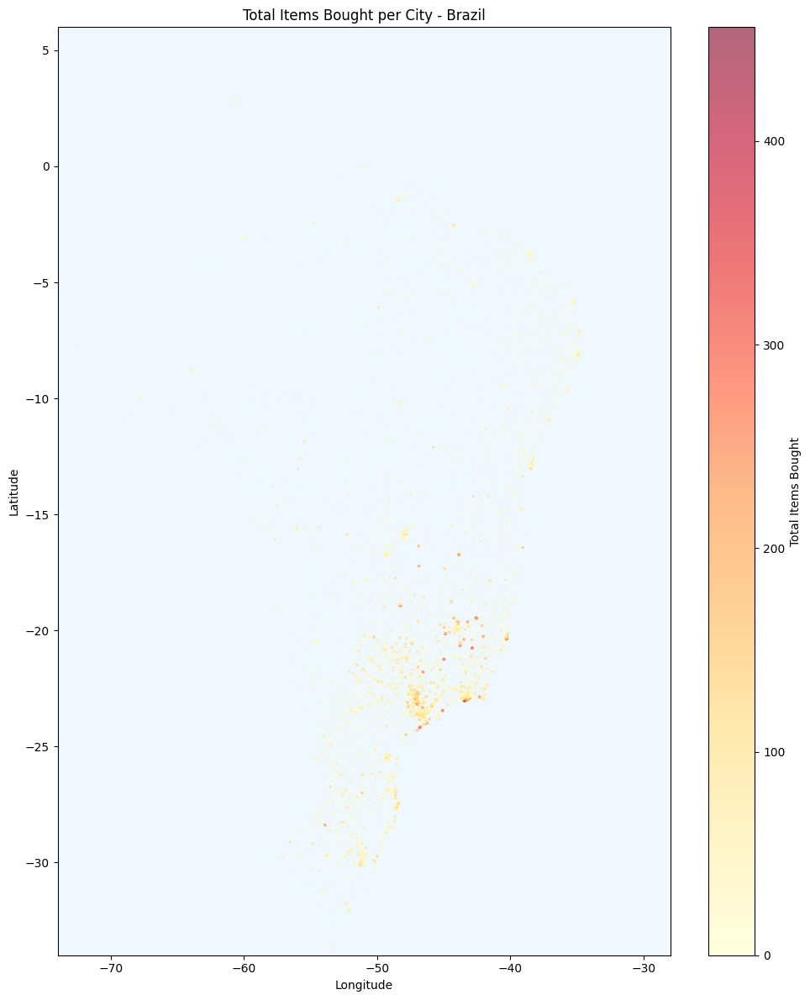

In [407]:
# Scatter map: cities colored by total items bought
city_items = df_orders.dropna(subset=['geolocation_lat', 'geolocation_lng']).groupby(
    ['customer_city', 'customer_state', 'geolocation_lat', 'geolocation_lng']
).agg(total_items=('item_count', 'sum'), total_orders=('order_id', 'nunique')).reset_index()

fig, ax = plt.subplots(figsize=(10, 12))
scatter = ax.scatter(
    city_items['geolocation_lng'], city_items['geolocation_lat'],
    s=np.sqrt(city_items['total_items']) * 0.5,
    c=city_items['total_items'], cmap='YlOrRd', alpha=0.6, edgecolors='none'
)
plt.colorbar(scatter, ax=ax, label='Total Items Bought')
ax.set_xlim(-74, -28)
ax.set_ylim(-34, 6)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Total Items Bought per City - Brazil')
ax.set_facecolor('#f0f8ff')
plt.tight_layout()
plt.savefig('map_brazil_items.png', dpi=150, bbox_inches='tight')
plt.show()


In [408]:
# Choropleth map -- states colored by total items bought

# Fetch state boundaries from IBGE API
r = requests.get(
    'https://servicodados.ibge.gov.br/api/v2/malhas/BR?resolucao=2&formato=application/vnd.geo+json',
    timeout=60
)
geo_states = r.json()
print(f'States loaded: {len(geo_states["features"])}')

# IBGE code -> state abbreviation
ibge_to_uf = {
    '11':'RO','12':'AC','13':'AM','14':'RR','15':'PA','16':'AP','17':'TO',
    '21':'MA','22':'PI','23':'CE','24':'RN','25':'PB','26':'PE','27':'AL','28':'SE','29':'BA',
    '31':'MG','32':'ES','33':'RJ','35':'SP',
    '41':'PR','42':'SC','43':'RS',
    '50':'MS','51':'MT','52':'GO','53':'DF'
}

for f in geo_states['features']:
    code = f['properties']['codarea']
    f['properties']['uf'] = ibge_to_uf.get(code, code)

# Aggregate items by state
state_items = df_orders.groupby('customer_state').agg(
    total_items=('item_count', 'sum'),
    total_orders=('order_id', 'nunique')
).reset_index()

# Quantile-based bins to spread colors evenly across states
bins = list(np.quantile(state_items['total_items'], [0, 0.2, 0.4, 0.6, 0.8, 0.95, 1.0]))
bins = sorted(set([round(b) for b in bins]))
print('Bins:', bins)

# Folium choropleth
m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=geo_states,
    data=state_items,
    columns=['customer_state', 'total_items'],
    key_on='feature.properties.uf',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Total Items Bought',
    nan_fill_color='lightgrey',
    bins=bins
).add_to(m)

# State labels
for f in geo_states['features']:
    coords = f['properties'].get('centroide')
    uf = f['properties']['uf']
    if coords:
        folium.Marker(
            location=[coords[1], coords[0]],
            icon=folium.DivIcon(html=f'<div style="font-size:9px;font-weight:bold;color:#333">{uf}</div>')
        ).add_to(m)

m.save('map_brazil_states.html')
print('Saved: map_brazil_states.html')
m


States loaded: 27
Bins: [156, 998, 2047, 4996, 12016, 41666, 137035]
Saved: map_brazil_states.html


In [409]:
# Choropleth maps -- total spent, avg ticket, avg freight per state

order_pay = df_orders.groupby(['customer_state', 'order_id'])['payment_value'].sum().reset_index()
state_metrics = order_pay.groupby('customer_state').agg(
    total_spent=('payment_value', 'sum'),
    avg_ticket=('payment_value', 'mean')
).reset_index().merge(
    df_orders.groupby('customer_state')['freight_value'].mean().reset_index(name='avg_freight'),
    on='customer_state'
)

def make_log_bins(series, n=6):
    min_val = max(series[series > 0].min(), 1)
    max_val = series.max() * 1.001
    return list(np.logspace(np.log10(min_val), np.log10(max_val), n + 1))

def make_quantile_bins(series, n=6):
    q = np.linspace(0, 100, n + 1)
    edges = np.unique(np.percentile(series.dropna(), q))
    if len(edges) < 2:
        edges = [series.min(), series.max()]
    edges[-1] = edges[-1] * 1.001 + 0.01
    return list(edges)

LEGEND_STYLE = """
<style>
.legend {
    overflow: visible !important;
    bottom: 10px !important;
}
.legend svg {
    transform: scale(1.8);
    transform-origin: bottom left;
    overflow: visible;
}
</style>
"""

def make_map(data, col, label, filename, color='YlOrRd', log=False):
    bins = make_log_bins(data[col]) if log else make_quantile_bins(data[col])
    m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')
    folium.Choropleth(
        geo_data=geo_states,
        data=data,
        columns=['customer_state', col],
        key_on='feature.properties.uf',
        fill_color=color,
        fill_opacity=0.8,
        line_opacity=0.5,
        legend_name=label,
        nan_fill_color='lightgrey',
        bins=bins
    ).add_to(m)
    for f in geo_states['features']:
        coords = f['properties'].get('centroide')
        uf = f['properties']['uf']
        if coords:
            folium.Marker(
                location=[coords[1], coords[0]],
                icon=folium.DivIcon(html=f'<div style="font-size:9px;font-weight:bold;color:#333">{uf}</div>')
            ).add_to(m)
    m.get_root().html.add_child(Element(LEGEND_STYLE))
    m.save(filename)
    print(f'Saved: {filename}')

make_map(state_metrics, 'total_spent', 'Total Spent (R$) — log scale', 'map_total_spent.html', 'Blues',   log=True)
make_map(state_metrics, 'avg_ticket',  'Avg Ticket (R$)',               'map_avg_ticket.html',  'Greens',  log=False)
make_map(state_metrics, 'avg_freight', 'Avg Freight (R$)',              'map_avg_freight.html', 'Oranges', log=False)
print('All maps saved.')

Saved: map_total_spent.html
Saved: map_avg_ticket.html
Saved: map_avg_freight.html
All maps saved.


In [410]:
# Choropleth map -- municipalities, logarithmic color scale

# Fetch all municipality boundaries
state_ids = [11,12,13,14,15,16,17, 21,22,23,24,25,26,27,28,29, 31,32,33,35, 41,42,43, 50,51,52,53]
all_features = []
print('Downloading municipality boundaries...')
for sid in state_ids:
    r = requests.get(
        f'https://servicodados.ibge.gov.br/api/v2/malhas/{sid}?resolucao=5&formato=application/vnd.geo+json',
        timeout=60
    )
    all_features.extend(r.json()['features'])
geo_muni = {'type': 'FeatureCollection', 'features': all_features}
print(f'Total municipalities: {len(all_features)}')

# Aggregate items by city + state
city_items = df_orders.groupby(['customer_city', 'customer_state']).agg(
    total_items=('item_count', 'sum')
).reset_index()

# Bridge to IBGE 7-digit code via GDP_cities
code_col = [c for c in GDP_cities.columns if 'digo' in c][0]
gdp_lookup = GDP_cities[['customer_city', 'customer_state', code_col]].copy()
gdp_lookup['ibge_code'] = gdp_lookup[code_col].astype(str).str.zfill(7)
city_with_code = city_items.merge(gdp_lookup, on=['customer_city', 'customer_state'], how='left').dropna(subset=['ibge_code'])

# Log10 transform (log10(1)=0 ... log10(18000)~4.25)
city_with_code['log_items'] = np.log10(city_with_code['total_items'] + 1)
city_dict = dict(zip(city_with_code['ibge_code'], city_with_code['total_items']))
log_dict  = dict(zip(city_with_code['ibge_code'], city_with_code['log_items']))

# Colormap on log scale with actual-value tick labels
log_max = city_with_code['log_items'].max()
tick_vals   = [1, 3, 10, 30, 100, 300, 1000, 3000, 10000]
tick_labels = [str(v) for v in tick_vals]
tick_logs   = [np.log10(v + 1) for v in tick_vals]

colormap = cm.LinearColormap(
    colors=['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026'],
    vmin=0, vmax=log_max,
    index=np.linspace(0, log_max, 9).tolist(),
    caption='Total Items Bought (log scale)'
)
colormap.tick_labels = tick_labels

# Style function using log-transformed value
def style_fn(feature):
    code = feature['properties']['codarea']
    lv = log_dict.get(code, None)
    if lv is None:
        return {'fillColor': '#f0f0f0', 'fillOpacity': 0.2, 'weight': 0.3, 'color': '#aaa'}
    return {'fillColor': colormap(lv), 'fillOpacity': 0.85, 'weight': 0.3, 'color': '#888'}

def tooltip_fn(feature):
    code = feature['properties']['codarea']
    val  = city_dict.get(code, 0)
    return f"{feature['properties'].get('nome', code)}: {val:,} items"

m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')

folium.GeoJson(
    geo_muni,
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(fields=['codarea'], aliases=['Code:'])
).add_to(m)

colormap.add_to(m)

m.save('map_brazil_municipalities.html')
print('Saved: map_brazil_municipalities.html')
m


Total municipalities: 5570
Saved: map_brazil_municipalities.html


In [411]:
# Heatmap of Brazil -- smooth, light background style

heat_data = (
    df_orders.dropna(subset=['geolocation_lat', 'geolocation_lng'])
    .groupby(['geolocation_lat', 'geolocation_lng'])
    .size()
    .reset_index(name='order_count')
)

heat_data['weight'] = np.log1p(heat_data['order_count'])
heat_points = heat_data[['geolocation_lat', 'geolocation_lng', 'weight']].values.tolist()

m = folium.Map(
    location=[-14.2, -51.9],
    zoom_start=4,
    tiles='CartoDB positron'
)

HeatMap(
    heat_points,
    min_opacity=0.4,
    radius=25,
    blur=20,
    max_zoom=10,
    gradient={0.0: 'blue', 0.3: 'cyan', 0.5: 'lime', 0.7: 'yellow', 0.85: 'orange', 1.0: 'red'}
).add_to(m)

m.save('heatmap_orders_brazil.html')
print('Saved: heatmap_orders_brazil.html')
m


Saved: heatmap_orders_brazil.html


In [412]:
# Heatmap -- average delivery time per city (one point per city)

# Aggregate by city: avg delivery days + representative lat/lng
delivery_city = (
    df_orders.dropna(subset=['geolocation_lat', 'geolocation_lng', 'delivery_days'])
    .groupby(['customer_city', 'customer_state'])
    .agg(
        avg_delivery=('delivery_days', 'mean'),
        lat=('geolocation_lat', 'mean'),
        lng=('geolocation_lng', 'mean'),
        n_orders=('order_id', 'nunique')
    )
    .reset_index()
)

# Only cities with enough orders for a reliable average
delivery_city = delivery_city[delivery_city['n_orders'] >= 5]
print(f'Cities: {len(delivery_city)} | Delivery range: {delivery_city["avg_delivery"].min():.1f} - {delivery_city["avg_delivery"].max():.1f} days')

heat_points = delivery_city[['lat', 'lng', 'avg_delivery']].values.tolist()

m = folium.Map(
    location=[-14.2, -51.9],
    zoom_start=4,
    tiles='CartoDB positron'
)

HeatMap(
    heat_points,
    min_opacity=0.4,
    radius=25,
    blur=20,
    max_zoom=10,
    gradient={0.0: 'blue', 0.3: 'cyan', 0.5: 'lime', 0.7: 'yellow', 0.85: 'orange', 1.0: 'red'}
).add_to(m)

m.save('heatmap_delivery_brazil.html')
print('Saved: heatmap_delivery_brazil.html')
m


Cities: 1541 | Delivery range: 5.6 - 52.3 days
Saved: heatmap_delivery_brazil.html


In [413]:
# Choropleth map -- number of sellers per state
# Uses geo_states already loaded in previous cell

# Count unique sellers per state from df_orders
seller_state = df_orders.groupby('seller_state').agg(
    n_sellers=('seller_id', 'nunique')
).reset_index().rename(columns={'seller_state': 'customer_state'})

# Custom bins: SP (1849) gets its own top color, rest distributed
bins = [0, 15, 50, 130, 260, 350, seller_state['n_sellers'].max() * 1.01]
print('Sellers per state:')
print(seller_state.sort_values('n_sellers', ascending=False).to_string(index=False))

m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')

folium.Choropleth(
    geo_data=geo_states,
    data=seller_state,
    columns=['customer_state', 'n_sellers'],
    key_on='feature.properties.uf',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Number of Sellers',
    nan_fill_color='lightgrey',
    bins=bins
).add_to(m)

for f in geo_states['features']:
    coords = f['properties'].get('centroide')
    uf = f['properties']['uf']
    if coords:
        folium.Marker(
            location=[coords[1], coords[0]],
            icon=folium.DivIcon(html=f'<div style="font-size:9px;font-weight:bold;color:#333">{uf}</div>')
        ).add_to(m)

m.save('map_sellers.html')
print('Saved: map_sellers.html')
m


Sellers per state:
customer_state  n_sellers
            SP       1755
            PR        334
            MG        236
            SC        182
            RJ        159
            RS        120
            GO         39
            DF         30
            ES         22
            BA         18
            CE         12
            PE          8
            PB          5
            MS          4
            MT          4
            RN          3
            RO          2
            SE          2
            AM          1
            AC          1
            PI          1
            MA          1
            PA          1
Saved: map_sellers.html


In [414]:
# Choropleth map -- number of sellers per municipality
# Uses geo_muni already loaded in previous cell

# Count sellers per city from df_orders
seller_city = (
    df_orders.dropna(subset=['seller_state'])
    .groupby(['seller_id', 'customer_city', 'customer_state'])  # seller_city not in df_orders
    .size().reset_index()
)

# Use olist_sellers for seller city directly
seller_city = olist_sellers.copy()
seller_city['seller_city'] = seller_city['seller_city'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('ascii').str.lower().str.strip()
seller_city['seller_state'] = seller_city['seller_state'].str.strip()

seller_city_agg = seller_city.groupby(['seller_city', 'seller_state']).agg(
    n_sellers=('seller_id', 'nunique')
).reset_index()

# Bridge to IBGE code via GDP_cities
code_col = [c for c in GDP_cities.columns if 'digo' in c][0]
gdp_lookup = GDP_cities[['customer_city', 'customer_state', code_col]].copy()
gdp_lookup['ibge_code'] = gdp_lookup[code_col].astype(str).str.zfill(7)

seller_city_agg = seller_city_agg.merge(
    gdp_lookup,
    left_on=['seller_city', 'seller_state'],
    right_on=['customer_city', 'customer_state'],
    how='left'
).dropna(subset=['ibge_code'])
print(f'Cities matched: {len(seller_city_agg)} | Max sellers: {seller_city_agg["n_sellers"].max()}')

# Log colormap -- SP city (694) alone at top
seller_city_agg['log_sellers'] = np.log10(seller_city_agg['n_sellers'] + 1)
city_log_dict = dict(zip(seller_city_agg['ibge_code'], seller_city_agg['log_sellers']))
city_val_dict = dict(zip(seller_city_agg['ibge_code'], seller_city_agg['n_sellers']))

log_max = seller_city_agg['log_sellers'].max()
colormap = cm.LinearColormap(
    colors=['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026'],
    vmin=0, vmax=log_max,
    index=np.linspace(0, log_max, 9).tolist(),
    caption='Number of Sellers (log scale)'
)

def style_fn(feature):
    code = feature['properties']['codarea']
    lv = city_log_dict.get(code, None)
    if lv is None:
        return {'fillColor': '#f0f0f0', 'fillOpacity': 0.15, 'weight': 0.3, 'color': '#aaa'}
    return {'fillColor': colormap(lv), 'fillOpacity': 0.85, 'weight': 0.3, 'color': '#888'}

m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')
folium.GeoJson(geo_muni, style_function=style_fn).add_to(m)
colormap.add_to(m)

m.save('map_sellers_cities.html')
print('Saved: map_sellers_cities.html')
m


Cities matched: 1611 | Max sellers: 695
Saved: map_sellers_cities.html


In [415]:
# Heatmap -- seller (store) locations
# Reusing geo_avg (avg lat/lng per zip) computed in data prep cell
sellers_geo = olist_sellers.merge(
    geo_avg.rename(columns={'geolocation_lat': 'lat', 'geolocation_lng': 'lng'}),
    left_on='seller_zip_code_prefix',
    right_on='geolocation_zip_code_prefix',
    how='left'
).dropna(subset=['lat', 'lng'])

seller_points = (
    sellers_geo.groupby(['lat', 'lng'])
    .agg(n_sellers=('seller_id', 'nunique'))
    .reset_index()
)
seller_points['weight'] = np.log1p(seller_points['n_sellers'])
print(f'Points: {len(seller_points)} | Max sellers per zip: {seller_points["n_sellers"].max()}')

m = folium.Map(location=[-14.2, -51.9], zoom_start=4, tiles='CartoDB positron')
HeatMap(
    seller_points[['lat', 'lng', 'weight']].values.tolist(),
    min_opacity=0.4, radius=5, blur=5, max_zoom=10,
    gradient={0.0: 'blue', 0.3: 'cyan', 0.5: 'lime', 0.7: 'yellow', 0.85: 'orange', 1.0: 'red'}
).add_to(m)
m.save('heatmap_sellers.html')
print('Saved: heatmap_sellers.html')
m


Points: 2239 | Max sellers per zip: 49
Saved: heatmap_sellers.html


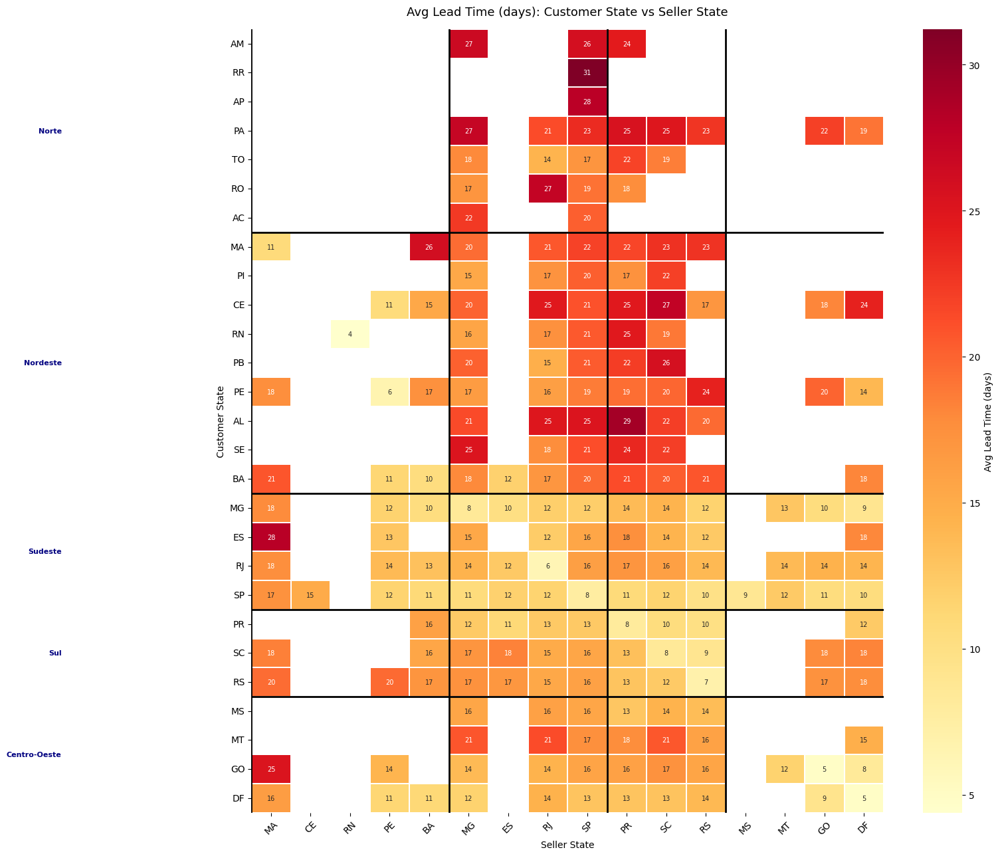

In [416]:
# Heatmap matrix -- seller state vs customer state, ordered by region
lead_matrix = (
    df_orders.dropna(subset=['seller_state', 'delivery_days'])
    .groupby(['seller_state', 'customer_state'])
    .agg(avg_lead=('delivery_days', 'mean'), n_orders=('order_id', 'nunique'))
    .reset_index()
)
lead_matrix = lead_matrix[lead_matrix['n_orders'] >= 10]

pivot = lead_matrix.pivot(index='customer_state', columns='seller_state', values='avg_lead')
row_order_f = [s for s in region_order if s in pivot.index]
col_order_f = [s for s in region_order if s in pivot.columns]
pivot = pivot.reindex(index=row_order_f, columns=col_order_f)

def get_boundaries(order, regions):
    boundaries, pos = [], 0
    for name, states in regions.items():
        pos += len([s for s in states if s in order])
        boundaries.append((name, pos))
    return boundaries

row_bounds = get_boundaries(row_order_f, regions_by_group)
col_bounds = get_boundaries(col_order_f, regions_by_group)

fig, ax = plt.subplots(figsize=(16, 13))
sns.heatmap(pivot, cmap='YlOrRd', annot=True, fmt='.0f',
            linewidths=0.3, linecolor='white', ax=ax,
            cbar_kws={'label': 'Avg Lead Time (days)'}, annot_kws={'size': 7})

for _, pos in row_bounds[:-1]:
    ax.axhline(pos, color='black', linewidth=2)
for _, pos in col_bounds[:-1]:
    ax.axvline(pos, color='black', linewidth=2)

prev = 0
for name, pos in row_bounds:
    if pos > prev:
        ax.text(-0.3, prev + (pos - prev) / 2, name, ha='right', va='center',
                fontsize=8, fontweight='bold', color='navy',
                transform=ax.get_yaxis_transform())
    prev = pos

ax.set_title('Avg Lead Time (days): Customer State vs Seller State', fontsize=13, pad=15)
ax.set_xlabel('Seller State')
ax.set_ylabel('Customer State')
ax.tick_params(axis='x', rotation=45)
ax.tick_params(axis='y', rotation=0)
plt.tight_layout()
plt.show()


Orders: 282,598


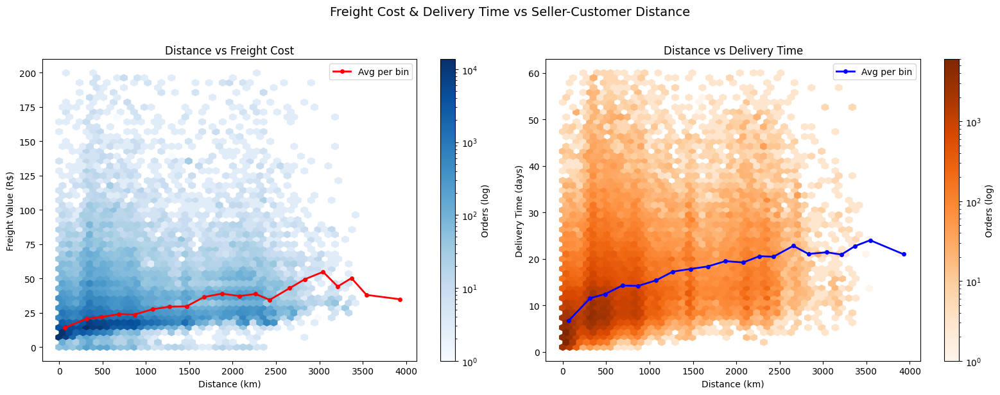

In [417]:
# Freight cost and delivery time vs distance seller/customer
# Reusing geo_avg (avg lat/lng per zip) for seller locations
df_dist = (
    df_orders
    .dropna(subset=['geolocation_lat', 'geolocation_lng', 'delivery_days',
                    'freight_value', 'seller_zip_code_prefix'])
    .merge(
        geo_avg.rename(columns={'geolocation_lat': 'seller_lat', 'geolocation_lng': 'seller_lng'}),
        left_on='seller_zip_code_prefix',
        right_on='geolocation_zip_code_prefix',
        how='left'
    )
    .dropna(subset=['seller_lat', 'seller_lng'])
    .copy()
)

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    a = np.sin((lat2-lat1)/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin((lon2-lon1)/2)**2
    return R * 2 * np.arcsin(np.sqrt(a))

df_dist['distance_km'] = haversine(
    df_dist['seller_lat'].values, df_dist['seller_lng'].values,
    df_dist['geolocation_lat'].values, df_dist['geolocation_lng'].values
)

df_plot = df_dist[
    (df_dist['delivery_days'].between(1, 60)) &
    (df_dist['distance_km'] <= 4000) &
    (df_dist['freight_value'] <= 200)
].copy()
print(f'Orders: {len(df_plot):,}')

df_plot['dist_bin'] = pd.cut(df_plot['distance_km'], bins=20)
agg = df_plot.groupby('dist_bin', observed=True).agg(
    avg_freight=('freight_value', 'mean'),
    avg_delivery=('delivery_days', 'mean'),
    dist_mid=('distance_km', 'mean'),
    n=('order_id', 'count')
).dropna()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

ax1 = axes[0]
hb1 = ax1.hexbin(df_plot['distance_km'], df_plot['freight_value'],
                  gridsize=50, cmap='Blues', mincnt=1, bins='log')
ax1.plot(agg['dist_mid'], agg['avg_freight'], color='red', linewidth=2,
         marker='o', markersize=4, label='Avg per bin')
fig.colorbar(hb1, ax=ax1, label='Orders (log)')
ax1.set_xlabel('Distance (km)')
ax1.set_ylabel('Freight Value (R$)')
ax1.set_title('Distance vs Freight Cost')
ax1.legend()

ax2 = axes[1]
hb2 = ax2.hexbin(df_plot['distance_km'], df_plot['delivery_days'],
                  gridsize=50, cmap='Oranges', mincnt=1, bins='log')
ax2.plot(agg['dist_mid'], agg['avg_delivery'], color='blue', linewidth=2,
         marker='o', markersize=4, label='Avg per bin')
fig.colorbar(hb2, ax=ax2, label='Orders (log)')
ax2.set_xlabel('Distance (km)')
ax2.set_ylabel('Delivery Time (days)')
ax2.set_title('Distance vs Delivery Time')
ax2.legend()

plt.suptitle('Freight Cost & Delivery Time vs Seller-Customer Distance', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()
